# ML pipeline

## Splitting

Splitting the data into test and train data

we want to take expressivelangraw into account. Stratify by this? 

The functions are under src, utils, split.py

In [1]:
# import libraries
import pandas as pd
import numpy as np

In [2]:
# read in data
clean_data = pd.read_csv('../in/clean_features.csv')
print(f"Number of unique participants is: {clean_data['Participant'].nunique()}")
clean_data.head()

Number of unique participants is: 67


,Participant,Visit,Duration,ASD,Gender,Age,ADOS,ExpressiveLangRaw,ADOS1,F0semitoneFrom27.5Hz_sma3nz_amean,...,slopeUV500-1500_sma3nz_amean,spectralFluxUV_sma3nz_amean,loudnessPeaksPerSec,VoicedSegmentsPerSec,MeanVoicedSegmentLengthSec,StddevVoicedSegmentLengthSec,MeanUnvoicedSegmentLength,StddevUnvoicedSegmentLength,equivalentSoundLevel_dBp,ExpressiveLangRaw1
0,0,1,23.74,0.0,1.0,40.13,NaN,NaN,NaN,40.659519,...,-0.002900,0.088063,1.390645,1.821262,0.158837,0.131736,0.378333,0.672536,-26.992199,NaN
1,0,1,8.15,0.0,1.0,40.13,NaN,NaN,NaN,38.676754,...,-0.006561,0.143007,1.719902,1.856436,0.170667,0.185812,0.348000,0.623690,-25.599806,NaN
2,0,1,2.83,0.0,1.0,40.13,NaN,NaN,NaN,45.456615,...,-0.001511,0.067914,4.964539,1.805054,0.066000,0.016248,0.468000,0.635623,-38.131786,NaN
3,0,1,3.96,0.0,1.0,40.13,NaN,NaN,NaN,43.732323,...,-0.004340,0.046791,2.025316,1.542416,0.073333,0.043076,0.668000,0.885356,-38.917393,NaN
4,0,1,31.76,0.0,1.0,40.13,NaN,NaN,NaN,42.977459,...,-0.001777,0.078688,2.078740,1.677215,0.170000,0.183920,0.498372,1.225437,-29.441130,NaN


In [3]:
from utils.split import custom_train_test_split

X_train, y_train, X_test, y_test = custom_train_test_split(clean_data, random_state=49) 
# 42 is a good pattern but low accuracy (with 12). 
# 47 could work, but it gets better result for new than same... 
# 49 is good!


/Users/idaelmosebroecker/Desktop/bachelor/coding/src/utils/split.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  boys_df['quantile'] = pd.qcut(boys_df['ExpressiveLangRaw1'], q=6, labels=False, duplicates='drop')


In [4]:
print("Training set shape:", X_train.shape, y_train.shape)
print("Test set shape:", X_test.shape, y_test.shape)

print(X_test['Participant'].nunique())
print(X_train['Participant'].nunique())


# ExpressiveLangRaw distribution in the test set
print("ExpressiveLangRaw distribution in test set:\n", X_test['ExpressiveLangRaw1'].describe())
print("ExpressiveLangRaw distribution in train set:\n", X_train['ExpressiveLangRaw1'].describe())

# ASD distribution in test set
print("ASD value counts in the test set:\n", y_test.value_counts())

# 12 is 18 % 
# 10 is 15 %
# 8 is 12 %


Training set shape: (49012, 97) (49012,)
Test set shape: (10365, 97) (10365,)
12
55
ExpressiveLangRaw distribution in test set:
 count    10365.000000
mean        21.150217
std          7.165203
min         11.000000
25%         15.000000
50%         19.000000
75%         27.000000
max         33.000000
Name: ExpressiveLangRaw1, dtype: float64
ExpressiveLangRaw distribution in train set:
 count    43545.000000
mean        18.858101
std          5.949119
min          8.000000
25%         14.000000
50%         18.000000
75%         22.000000
max         33.000000
Name: ExpressiveLangRaw1, dtype: float64
ASD value counts in the test set:
 ASD
0.0    5675
1.0    4690
Name: count, dtype: int64


In [5]:
#X_test.groupby('Participant')['Gender'].value_counts() # all boys! 
#X_train.groupby('Participant')['Gender'].value_counts() # is there an overlap?

# check for overlap: 
participants_test = set(X_test['Participant'].unique())
participants_train = set(X_train['Participant'].unique())

overlap = participants_test.intersection(participants_train)
overlap


set()

## Split based on visits

### Assessing whether this ability to predict varies according to visit (is it easier at later visits) 
Take all the data except the age we test on. 
-	Train on 1:5, test on 6.
-	Train on 1:4, 5, test on 5
-	Train on 1:3, 5:6 test on 4
-	Train on 1:2, 4:6 test on 3
-	Train on 1, 3:6 test on 2
-	Train on 2:6 test on 1. 

#### Testing on the same participants

In [6]:
from utils.split import train_test_split_by_visit_same

splits_same = train_test_split_by_visit_same(clean_data, random_state=666)

# Access splits for visit 1
X_train_same1 = splits_same['visit_1']['X_train']
y_train_same1 = splits_same['visit_1']['y_train']
X_test_same1 = splits_same['visit_1']['X_test']
y_test_same1 = splits_same['visit_1']['y_test']

print(f"X_train_same1 shape: {X_train_same1.shape}, y_train_same1 shape: {y_train_same1.shape}")
print(f"X_test_same1 shape: {X_test_same1.shape}, y_test_visit1 shape: {y_test_same1.shape}")


X_train_same1 shape: (50398, 90), y_train_same1 shape: (50398,)
X_test_same1 shape: (8979, 90), y_test_visit1 shape: (8979,)


In [7]:
X_train_same1

,Visit,Duration,F0semitoneFrom27.5Hz_sma3nz_amean,F0semitoneFrom27.5Hz_sma3nz_stddevNorm,F0semitoneFrom27.5Hz_sma3nz_percentile20.0,F0semitoneFrom27.5Hz_sma3nz_percentile50.0,F0semitoneFrom27.5Hz_sma3nz_percentile80.0,F0semitoneFrom27.5Hz_sma3nz_pctlrange0-2,F0semitoneFrom27.5Hz_sma3nz_meanRisingSlope,F0semitoneFrom27.5Hz_sma3nz_stddevRisingSlope,...,slopeUV0-500_sma3nz_amean,slopeUV500-1500_sma3nz_amean,spectralFluxUV_sma3nz_amean,loudnessPeaksPerSec,VoicedSegmentsPerSec,MeanVoicedSegmentLengthSec,StddevVoicedSegmentLengthSec,MeanUnvoicedSegmentLength,StddevUnvoicedSegmentLength,equivalentSoundLevel_dBp
149,2,3.43,45.024597,0.213317,35.255386,44.072021,55.277176,20.021790,98.305779,91.660156,...,0.043569,0.005433,0.098727,3.801170,2.077151,0.077143,0.047121,0.335000,0.329393,-35.111191
150,2,7.83,39.413517,0.091858,35.696163,39.230389,41.631111,5.934948,94.092857,55.155025,...,0.052470,0.000134,0.117584,1.790281,2.061856,0.126875,0.090189,0.338125,0.597779,-30.406982
151,2,230.00,43.673294,0.233337,32.122253,43.198914,55.221508,23.099255,655.625854,890.658264,...,0.056044,-0.001945,0.137077,3.930131,3.587444,0.215000,0.160078,0.068000,0.081339,-30.711157
152,2,111.00,45.069893,0.096717,44.706543,45.063526,50.207039,5.500496,380.878296,191.892456,...,0.054103,0.009340,0.074370,3.636364,2.857143,0.290000,0.374789,0.065000,0.035000,-31.747877
153,2,21.37,41.520103,0.169046,35.019958,41.775276,47.937355,12.917397,104.060356,70.727997,...,0.022243,0.003737,0.126919,3.230337,1.548569,0.095758,0.084173,0.563548,0.954671,-32.095676
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59372,6,3.02,34.108238,0.122650,33.502441,35.000225,36.954411,3.451969,260.581543,148.846268,...,0.012315,-0.002640,0.109798,2.657807,3.040540,0.153333,0.130128,0.153333,0.227547,-28.029463
59373,6,17.22,39.396801,0.216041,34.770889,37.917168,45.892136,11.121246,404.563965,321.783203,...,0.009889,-0.005397,0.122169,2.091807,1.631702,0.126786,0.075074,0.482593,0.979704,-29.263926
59374,6,10.34,37.399639,0.152843,34.794445,38.222595,42.156124,7.361679,435.294128,509.256195,...,0.011527,-0.007668,0.099432,2.129719,1.070039,0.205455,0.150838,0.709091,1.135945,-30.744387
59375,6,57.22,35.548386,0.144766,33.447212,35.756317,39.343788,5.896576,108.646431,72.489708,...,0.011437,-0.004979,0.100879,0.926412,0.734780,0.110714,0.102153,1.259512,2.467880,-31.588963


In [8]:
y_test_same1.value_counts()

ASD
1.0    4617
0.0    4362
Name: count, dtype: int64

#### Testing on new participants

In [9]:
from utils.split import train_test_split_by_visit_new

columns_to_remove = ['Gender','Age', 'ExpressiveLangRaw', 'ExpressiveLangRaw1', 'Participant', 'ADOS', 'ADOS1']


# Remove the specified columns from X_train and X_test
X_train = X_train.drop(columns=columns_to_remove, errors='ignore')
X_test = X_test.drop(columns=columns_to_remove, errors='ignore')

# use the custom function
visits = sorted(clean_data['Visit'].unique())  
splits_new = train_test_split_by_visit_new(X_train, y_train, X_test, y_test, visits)

# Accessing the split for Visit 1 
X_train_new1 = splits_new['visit_1']['X_train']
y_train_new1 = splits_new['visit_1']['y_train']
X_test_new1 = splits_new['visit_1']['X_test']
y_test_new1 = splits_new['visit_1']['y_test']

print(f"X_train_new1 shape: {X_train_new1.shape}, y_train_new1 shape: {y_train_new1.shape}")
print(f"X_test_new1 shape: {X_test_new1.shape}, y_test_new1 shape: {y_test_new1.shape}")


X_train_new1 shape: (41903, 90), y_train_new1 shape: (41903,)
X_test_new1 shape: (1870, 90), y_test_new1 shape: (1870,)


In [10]:
y_test_new1.value_counts()

ASD
1.0    969
0.0    901
Name: count, dtype: int64

In [11]:


feature_names = X_train.columns.tolist()


## Scale the whole dataset

In [12]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

# Fit the scaler on the X_train_sample data
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test) # add to test

## Bayesian optimization 

Optuna: https://medium.com/@taeefnajib/hyperparameter-tuning-using-optuna-c46d7b29a3e

#### Try this analysis: 
https://www.kaggle.com/code/para24/xgboost-stepwise-tuning-using-optuna#7.-Stepwise-Hyperparameter-Tuning

### XGBoost

#### Default params

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=-1,
              num_parallel_tree=None, random_state=0, ...)

=============================> TRAIN-TEST DETAILS <======================================
Train Size: 49012 samples
 Test Size: 10365 samples
---------------------------------------------
Training Time: 0 seconds
 Testing Time: 0.005 seconds
----

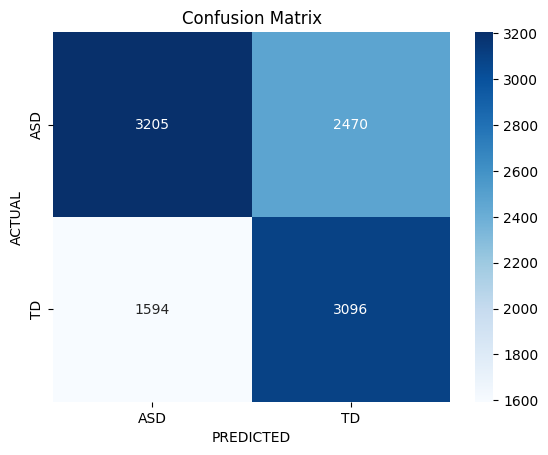


=======================================> PLOTS <=========================================


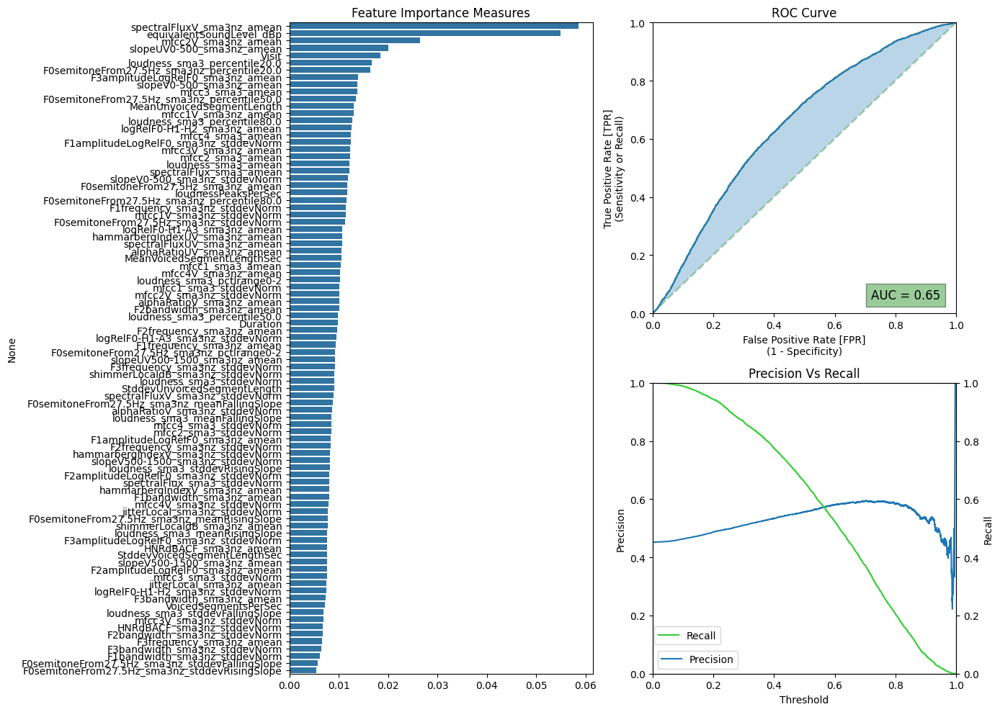

In [13]:
from utils.optimization import report, compare_models

# XGBoost with default parameters 
from xgboost import XGBClassifier
from sklearn.utils import class_weight
from sklearn import metrics



primary_eval_metric = metrics.f1_score
confusion_lbs = ['ASD', 'TD']

## Compute `class_weights` using sklearn
cls_weight = (y_train.shape[0] - np.sum(y_train)) / np.sum(y_train)


# train the default classifier
xgb_clf_default = XGBClassifier(scale_pos_weight=cls_weight,
                                random_state=0, n_jobs=-1)
xgb_clf_default.fit(X_train, y_train);

xgb_clf_default, xgb_report_default = report(xgb_clf_default, X_train, y_train,
                                             X_test, y_test,
                                             display_scores=[primary_eval_metric],
                                             importance_plot=True,
                                             feature_labels=feature_names,
                                             confusion_labels=confusion_lbs)

### Tune hyperparameters

In [14]:
from utils.optimization import stepwise_optimization

# peform bayesian optimization 

params1 = stepwise_optimization(X_train, y_train, trials=10) # 10 trials is default 
params1

=========================== Optimizing Group - 1 ============================


[I 2024-11-04 16:26:53,762] A new study created in RDB with name: xgboost4
[I 2024-11-04 16:27:04,310] Trial 2 finished with value: 0.6678447999999999 and parameters: {'max_depth': 3, 'min_child_weight': 3148272667.542118}. Best is trial 2 with value: 0.6678447999999999.
[I 2024-11-04 16:27:04,438] Trial 3 finished with value: 0.6678447999999999 and parameters: {'max_depth': 8, 'min_child_weight': 581793750.0812377}. Best is trial 2 with value: 0.6678447999999999.
[I 2024-11-04 16:27:05,042] Trial 6 finished with value: 0.6179908 and parameters: {'max_depth': 2, 'min_child_weight': 349.33614779072394}. Best is trial 2 with value: 0.6678447999999999.
[I 2024-11-04 16:27:08,421] Trial 5 finished with value: 0.6671935999999999 and parameters: {'max_depth': 6, 'min_child_weight': 2.4146559619455513e-08}. Best is trial 2 with value: 0.6678447999999999.
[I 2024-11-04 16:27:09,661] Trial 7 finished with value: 0.6732959999999999 and parameters: {'max_depth': 7, 'min_child_weight': 25.49288992

STUDY NAME:  xgboost4
------------------------------------------------
EVALUATION METRIC:  f1_score
------------------------------------------------
BEST CV SCORE 0.6853698
------------------------------------------------
OPTIMAL GROUP - 1 PARAMS:  {'max_depth': 10, 'min_child_weight': 2.943987170602832}
------------------------------------------------
BEST TRIAL FrozenTrial(number=4, state=1, values=[0.6853698], datetime_start=datetime.datetime(2024, 11, 4, 16, 26, 53, 796732), datetime_complete=datetime.datetime(2024, 11, 4, 16, 27, 13, 287393), params={'max_depth': 10, 'min_child_weight': 2.943987170602832}, user_attrs={}, system_attrs={}, intermediate_values={0: 0.6432622, 1: 0.6589031999999999, 2: 0.6655518, 3: 0.6688750000000001, 4: 0.6724536000000001, 5: 0.6765082, 6: 0.678844, 7: 0.681289, 8: 0.6817232, 9: 0.6853698}, distributions={'max_depth': IntDistribution(high=10, log=False, low=2, step=1), 'min_child_weight': FloatDistribution(high=10000000000.0, log=True, low=1e-10, ste

[I 2024-11-04 16:27:33,354] Trial 13 pruned. Trial was pruned at iteration 5.
[I 2024-11-04 16:27:34,156] Trial 16 pruned. Trial was pruned at iteration 5.
[I 2024-11-04 16:27:38,548] Trial 12 pruned. Trial was pruned at iteration 5.
[I 2024-11-04 16:27:39,549] Trial 10 pruned. Trial was pruned at iteration 5.
[I 2024-11-04 16:27:39,561] Trial 14 pruned. Trial was pruned at iteration 5.
[I 2024-11-04 16:27:39,784] Trial 17 pruned. Trial was pruned at iteration 5.
[I 2024-11-04 16:27:55,796] Trial 11 finished with value: 0.6801982000000001 and parameters: {'subsample': 0.5704082854065795, 'colsample_bytree': 0.9963721596338719}. Best is trial 4 with value: 0.6853698.
[I 2024-11-04 16:27:55,809] Trial 15 finished with value: 0.681995 and parameters: {'subsample': 0.9495210958175446, 'colsample_bytree': 0.570085487861274}. Best is trial 4 with value: 0.6853698.
[I 2024-11-04 16:28:01,118] Trial 18 finished with value: 0.6869020000000001 and parameters: {'subsample': 0.9820551703357974, 'c

STUDY NAME:  xgboost4
------------------------------------------------
EVALUATION METRIC:  f1_score
------------------------------------------------
BEST CV SCORE 0.6869020000000001
------------------------------------------------
OPTIMAL GROUP - 2 PARAMS:  {'subsample': 0.9820551703357974, 'colsample_bytree': 0.9357504428583199}
------------------------------------------------
BEST TRIAL FrozenTrial(number=18, state=1, values=[0.6869020000000001], datetime_start=datetime.datetime(2024, 11, 4, 16, 27, 33, 784623), datetime_complete=datetime.datetime(2024, 11, 4, 16, 28, 1, 111732), params={'subsample': 0.9820551703357974, 'colsample_bytree': 0.9357504428583199}, user_attrs={}, system_attrs={}, intermediate_values={0: 0.636938, 1: 0.6575342, 2: 0.663498, 3: 0.6693488, 4: 0.6729544, 5: 0.678428, 6: 0.6801172000000001, 7: 0.6831996, 8: 0.6837812, 9: 0.6869020000000001}, distributions={'subsample': FloatDistribution(high=1.0, log=False, low=0.05, step=None), 'colsample_bytree': FloatDistri

[I 2024-11-04 16:30:39,920] Trial 20 finished with value: 0.6800738000000001 and parameters: {'learning_rate': 0.04019295319798741}. Best is trial 18 with value: 0.6869020000000001.
[I 2024-11-04 16:30:39,954] Trial 21 finished with value: 0.6846774 and parameters: {'learning_rate': 0.052479936407183965}. Best is trial 18 with value: 0.6869020000000001.
[I 2024-11-04 16:30:39,967] Trial 26 finished with value: 0.6837915999999999 and parameters: {'learning_rate': 0.06915979915296318}. Best is trial 18 with value: 0.6869020000000001.
[I 2024-11-04 16:30:39,969] Trial 25 finished with value: 0.682659 and parameters: {'learning_rate': 0.049648606264186476}. Best is trial 18 with value: 0.6869020000000001.
[I 2024-11-04 16:30:39,994] Trial 22 finished with value: 0.6813014000000001 and parameters: {'learning_rate': 0.05651900175258362}. Best is trial 18 with value: 0.6869020000000001.
[I 2024-11-04 16:30:39,995] Trial 23 finished with value: 0.6782708000000001 and parameters: {'learning_rat

STUDY NAME:  xgboost4
------------------------------------------------
EVALUATION METRIC:  f1_score
------------------------------------------------
BEST CV SCORE 0.6869020000000001
------------------------------------------------
OPTIMAL GROUP - 3 PARAMS:  {'subsample': 0.9820551703357974, 'colsample_bytree': 0.9357504428583199}
------------------------------------------------
BEST TRIAL FrozenTrial(number=18, state=1, values=[0.6869020000000001], datetime_start=datetime.datetime(2024, 11, 4, 16, 27, 33, 784623), datetime_complete=datetime.datetime(2024, 11, 4, 16, 28, 1, 111732), params={'subsample': 0.9820551703357974, 'colsample_bytree': 0.9357504428583199}, user_attrs={}, system_attrs={}, intermediate_values={0: 0.636938, 1: 0.6575342, 2: 0.663498, 3: 0.6693488, 4: 0.6729544, 5: 0.678428, 6: 0.6801172000000001, 7: 0.6831996, 8: 0.6837812, 9: 0.6869020000000001}, distributions={'subsample': FloatDistribution(high=1.0, log=False, low=0.05, step=None), 'colsample_bytree': FloatDistri

{'learning_rate': 0.09754596670520119,
 'max_depth': 10,
 'min_child_weight': 2.943987170602832,
 'subsample': 0.9820551703357974,
 'colsample_bytree': 0.9357504428583199}

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.9357504428583199, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.09754596670520119,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=10, max_leaves=None,
              min_child_weight=2.943987170602832, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=-1, num_parallel_tree=None, random_state=0, ...)

=============================> TRAIN-TEST DETAILS <======================================
Train Size: 49012 samples
 Test Size: 10365 samples
---------------------------------------------
Trai

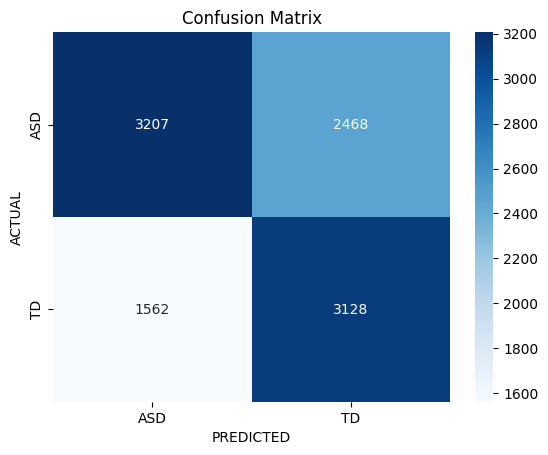


=======================================> PLOTS <=========================================


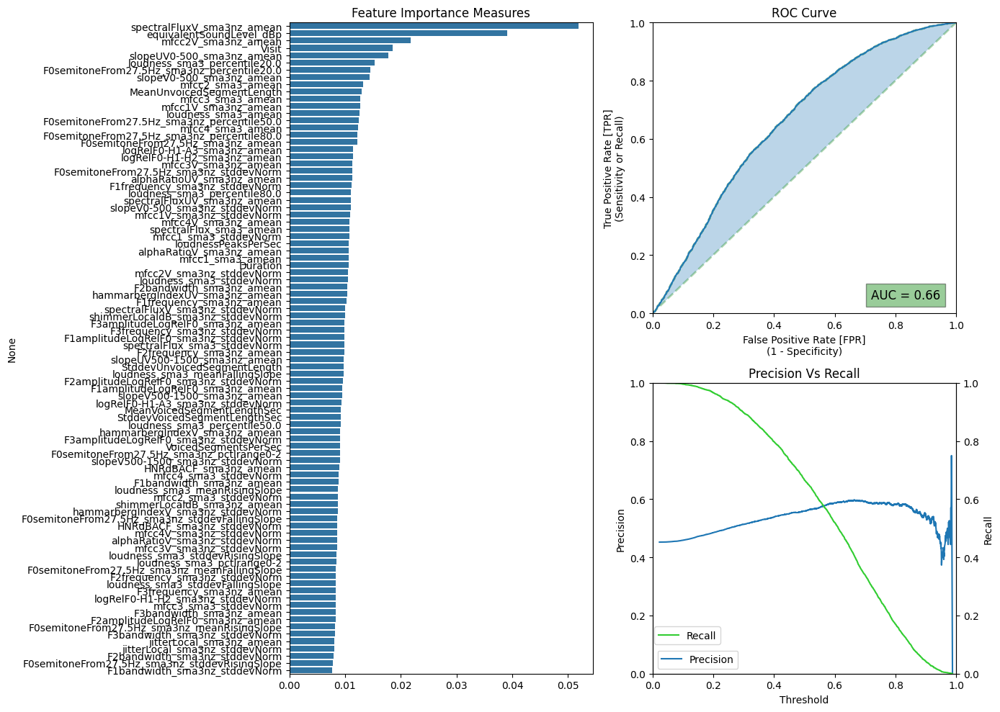

In [15]:
import seaborn as sns
sns.reset_orig()

xgb_clf_tuned_1 = XGBClassifier(**params1, scale_pos_weight=cls_weight,
                                random_state=0, n_jobs=-1)
xgb_clf_tuned_1.fit(X_train, y_train);

xgb_clf_tuned_1, xgb_report_tuned_1 = report(xgb_clf_tuned_1, X_train, y_train,
                                             X_test, y_test,
                                             display_scores=[primary_eval_metric],
                                             importance_plot=True,
                                             feature_labels=feature_names,
                                             confusion_labels=confusion_lbs)

In [14]:
from utils.optimization import stepwise_optimization

params2 = stepwise_optimization(X_train, y_train, trials=50)
params2

=========================== Optimizing Group - 1 ============================


[I 2024-12-16 16:07:57,109] Using an existing study with name 'xgboost4' instead of creating a new one.
[I 2024-12-16 16:07:58,511] Trial 93 pruned. Trial was pruned at iteration 5.
[I 2024-12-16 16:07:58,567] Using an existing study with name 'xgboost4' instead of creating a new one.


STUDY NAME:  xgboost4
------------------------------------------------
EVALUATION METRIC:  f1_score
------------------------------------------------
BEST CV SCORE 0.6869020000000001
------------------------------------------------
OPTIMAL GROUP - 1 PARAMS:  {'subsample': 0.9820551703357974, 'colsample_bytree': 0.9357504428583199}
------------------------------------------------
BEST TRIAL FrozenTrial(number=18, state=1, values=[0.6869020000000001], datetime_start=datetime.datetime(2024, 11, 4, 16, 27, 33, 784623), datetime_complete=datetime.datetime(2024, 11, 4, 16, 28, 1, 111732), params={'subsample': 0.9820551703357974, 'colsample_bytree': 0.9357504428583199}, user_attrs={}, system_attrs={}, intermediate_values={0: 0.636938, 1: 0.6575342, 2: 0.663498, 3: 0.6693488, 4: 0.6729544, 5: 0.678428, 6: 0.6801172000000001, 7: 0.6831996, 8: 0.6837812, 9: 0.6869020000000001}, distributions={'subsample': FloatDistribution(high=1.0, log=False, low=0.05, step=None), 'colsample_bytree': FloatDistri

[I 2024-12-16 16:07:59,757] Trial 94 pruned. Trial was pruned at iteration 5.
[I 2024-12-16 16:07:59,932] Using an existing study with name 'xgboost4' instead of creating a new one.


STUDY NAME:  xgboost4
------------------------------------------------
EVALUATION METRIC:  f1_score
------------------------------------------------
BEST CV SCORE 0.6869020000000001
------------------------------------------------
OPTIMAL GROUP - 2 PARAMS:  {'subsample': 0.9820551703357974, 'colsample_bytree': 0.9357504428583199}
------------------------------------------------
BEST TRIAL FrozenTrial(number=18, state=1, values=[0.6869020000000001], datetime_start=datetime.datetime(2024, 11, 4, 16, 27, 33, 784623), datetime_complete=datetime.datetime(2024, 11, 4, 16, 28, 1, 111732), params={'subsample': 0.9820551703357974, 'colsample_bytree': 0.9357504428583199}, user_attrs={}, system_attrs={}, intermediate_values={0: 0.636938, 1: 0.6575342, 2: 0.663498, 3: 0.6693488, 4: 0.6729544, 5: 0.678428, 6: 0.6801172000000001, 7: 0.6831996, 8: 0.6837812, 9: 0.6869020000000001}, distributions={'subsample': FloatDistribution(high=1.0, log=False, low=0.05, step=None), 'colsample_bytree': FloatDistri

[I 2024-12-16 16:08:01,170] Trial 95 pruned. Trial was pruned at iteration 5.


STUDY NAME:  xgboost4
------------------------------------------------
EVALUATION METRIC:  f1_score
------------------------------------------------
BEST CV SCORE 0.6869020000000001
------------------------------------------------
OPTIMAL GROUP - 3 PARAMS:  {'subsample': 0.9820551703357974, 'colsample_bytree': 0.9357504428583199}
------------------------------------------------
BEST TRIAL FrozenTrial(number=18, state=1, values=[0.6869020000000001], datetime_start=datetime.datetime(2024, 11, 4, 16, 27, 33, 784623), datetime_complete=datetime.datetime(2024, 11, 4, 16, 28, 1, 111732), params={'subsample': 0.9820551703357974, 'colsample_bytree': 0.9357504428583199}, user_attrs={}, system_attrs={}, intermediate_values={0: 0.636938, 1: 0.6575342, 2: 0.663498, 3: 0.6693488, 4: 0.6729544, 5: 0.678428, 6: 0.6801172000000001, 7: 0.6831996, 8: 0.6837812, 9: 0.6869020000000001}, distributions={'subsample': FloatDistribution(high=1.0, log=False, low=0.05, step=None), 'colsample_bytree': FloatDistri

{'learning_rate': 0.034441194867653256,
 'max_depth': 7,
 'min_child_weight': 0.5460645810929312,
 'subsample': 0.9820551703357974,
 'colsample_bytree': 0.9357504428583199}

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.9357504428583199, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.034441194867653256,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=7, max_leaves=None,
              min_child_weight=0.5460645810929312, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=-1, num_parallel_tree=None, random_state=0, ...)

=============================> TRAIN-TEST DETAILS <======================================
Train Size: 49012 samples
 Test Size: 10365 samples
---------------------------------------------
Tra

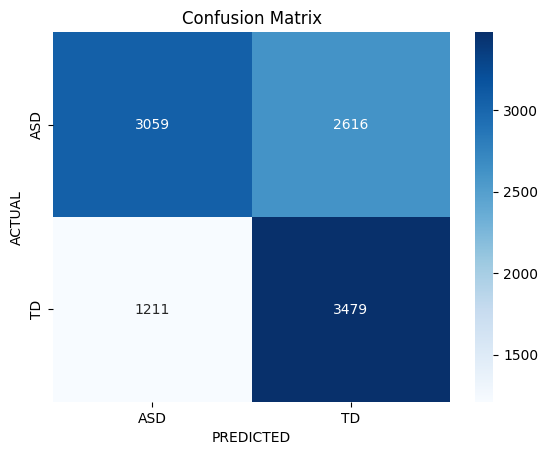


=======================================> PLOTS <=========================================


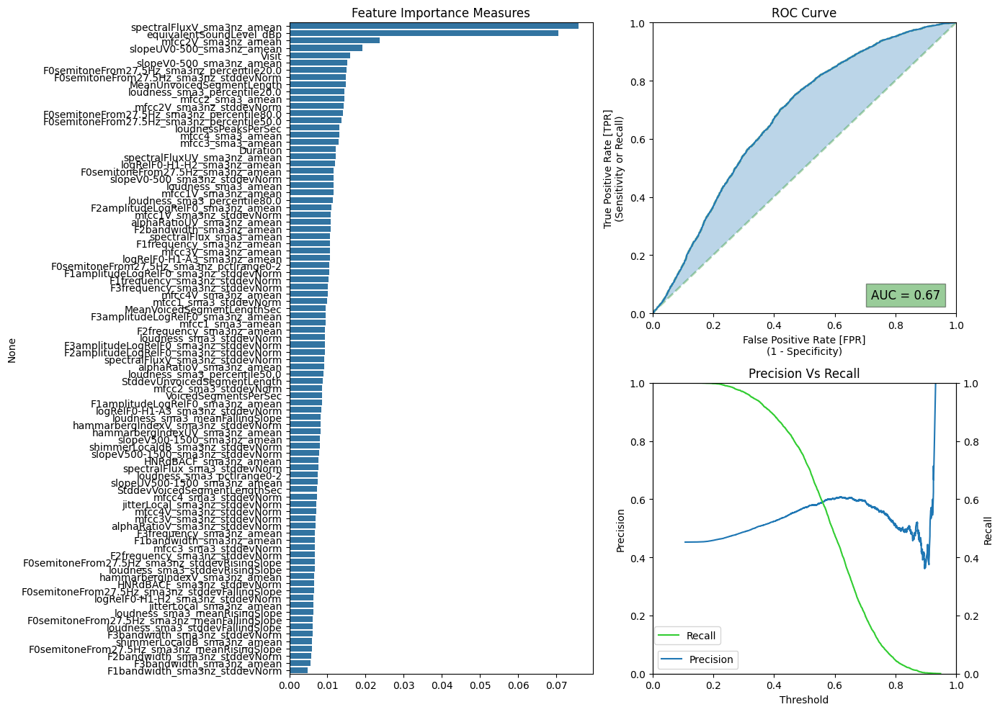

In [15]:
xgb_clf_tuned_2 = XGBClassifier(**params2, scale_pos_weight=cls_weight,
                                random_state=0, n_jobs=-1)
xgb_clf_tuned_2.fit(X_train, y_train);

xgb_clf_tuned_2, xgb_report_tuned_2 = report(xgb_clf_tuned_2, X_train, y_train,
                                             X_test, y_test,
                                             display_scores=[primary_eval_metric],
                                             importance_plot=True,
                                             feature_labels=feature_names,
                                             confusion_labels=confusion_lbs)

NameError: name 'oij' is not defined

### SVM

#### Default params

SVC(class_weight='balanced', probability=True, random_state=42)

=============================> TRAIN-TEST DETAILS <======================================
Train Size: 49012 samples
 Test Size: 10365 samples
---------------------------------------------
Training Time: 0 seconds
 Testing Time: 40.931 seconds
---------------------------------------------
Train Accuracy:  0.676038521178487
 Test Accuracy:  0.6470815243608297
---------------------------------------------
Train F1 Score:  0.6694149489902145
 Test F1 Score:  0.6518180087569008

---------------------------------------------
 Area Under ROC (test):  0.6905577336727313
---------------------------------------------
Model Memory Size: 27260.58 kB

=============================> CLASSIFICATION REPORT <===================================
              precision    recall  f1-score   support

         ASD       0.72      0.58      0.64      5675
          TD       0.59      0.73      0.65      4690

    accuracy                      

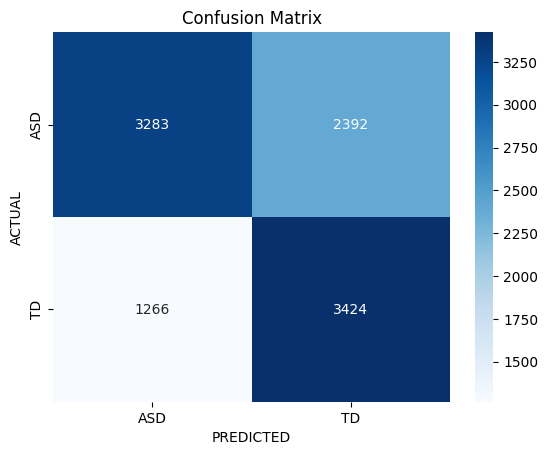


=======================================> PLOTS <=========================================


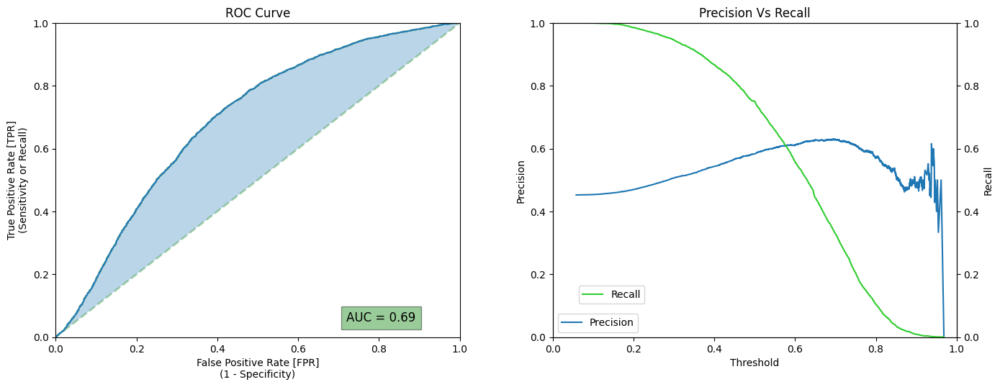

In [16]:
from utils.optimization import execute_optimization_SVM
from sklearn.svm import SVC
from utils.optimization import report
from sklearn import metrics

#train with default
default_SVM = SVC(probability=True,
              class_weight='balanced', random_state=42)

# Fit the final model
default_SVM.fit(X_train, y_train);

primary_eval_metric = metrics.f1_score
confusion_lbs = ['ASD', 'TD']
default_SVM, svm_report = report(default_SVM, X_train, y_train,
                                             X_test, y_test,
                                             display_scores=[primary_eval_metric],
                                             importance_plot=False,
                                             feature_labels=feature_names,
                                             confusion_labels=confusion_lbs)




#### Tune hyperparameters

In [277]:
from utils.optimization import execute_optimization_SVM
from sklearn.svm import SVC

# perform optimization
params_SVM1 = execute_optimization_SVM("SVM2", trials=20, X_train=X_train, y_train=y_train)
params_SVM1

[I 2024-11-25 14:50:03,108] Using an existing study with name 'SVM2' instead of creating a new one.
Python(42354) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(42355) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(42356) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(42357) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(42358) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(42359) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(42360) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(42361) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
[I 2024-11-25 14:55:53,700] Trial 110 finished with value: 0.5914265453570385 and parameters: {'C': 0.86032792702647

STUDY NAME:  SVM2
------------------------------------------------
BEST CV SCORE 0.592099867338247
------------------------------------------------
BEST TRIAL FrozenTrial(number=63, state=1, values=[0.592099867338247], datetime_start=datetime.datetime(2024, 11, 5, 14, 51, 32, 948774), datetime_complete=datetime.datetime(2024, 11, 5, 15, 51, 51, 577179), params={'C': 0.7945942559253938, 'gamma': 'auto'}, user_attrs={}, system_attrs={}, intermediate_values={}, distributions={'C': FloatDistribution(high=10000.0, log=True, low=0.0001, step=None), 'gamma': CategoricalDistribution(choices=('scale', 'auto'))}, trial_id=154, value=None)
------------------------------------------------


{'C': 0.7945942559253938, 'gamma': 'auto'}

SVC(C=0.7945942559253938, class_weight='balanced', gamma='auto',
    probability=True, random_state=42)

=============================> TRAIN-TEST DETAILS <======================================
Train Size: 49012 samples
 Test Size: 10365 samples
---------------------------------------------
Training Time: 0 seconds
 Testing Time: 46.921 seconds
---------------------------------------------
Train Accuracy:  0.644393209826165
 Test Accuracy:  0.6234442836468885
---------------------------------------------
Train F1 Score:  0.6306711025407387
 Test F1 Score:  0.6366936609885507

---------------------------------------------
 Area Under ROC (test):  0.6672945906089439
---------------------------------------------
Model Memory Size: 29551.38 kB

=============================> CLASSIFICATION REPORT <===================================
              precision    recall  f1-score   support

         ASD       0.71      0.54      0.61      5675
          TD       0.57      0.73      0.64      

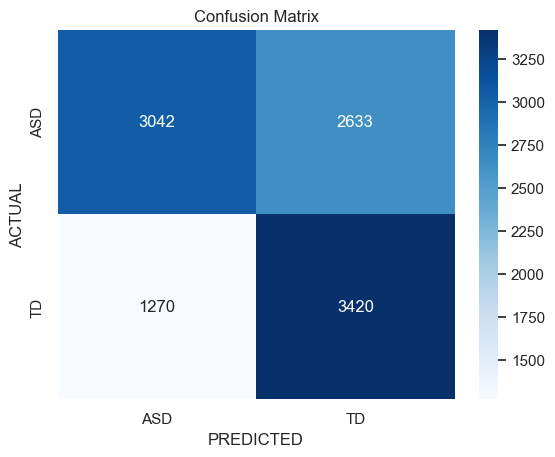


=======================================> PLOTS <=========================================


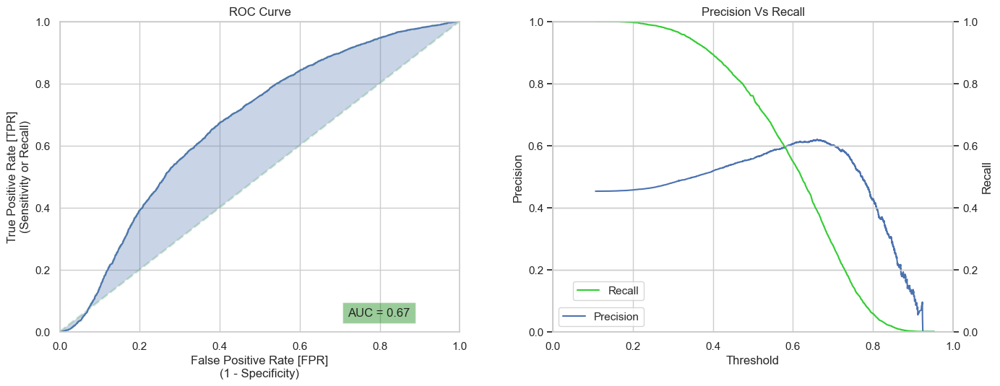

In [278]:
# fit it
svm_clf_tuned_1 = SVC(**params_SVM1, probability=True,
              class_weight='balanced', random_state=42)

svm_clf_tuned_1.fit(X_train, y_train);

svm_clf_tuned_1, svm_report_tuned_1 = report(svm_clf_tuned_1, X_train, y_train,
                                             X_test, y_test,
                                             display_scores=[primary_eval_metric],
                                             importance_plot=False,
                                             feature_labels=feature_names,
                                             confusion_labels=confusion_lbs)

[I 2025-01-03 15:39:49,694] A new study created in RDB with name: SVM3
[I 2025-01-03 16:00:26,686] Trial 5 finished with value: 0.5758793923610709 and parameters: {'C': 620.1498633328698, 'gamma': 'auto', 'kernel': 'poly'}. Best is trial 5 with value: 0.5758793923610709.
[I 2025-01-03 16:02:48,017] Trial 2 finished with value: 0.5705950304939651 and parameters: {'C': 527.9169981300931, 'gamma': 'auto', 'kernel': 'rbf'}. Best is trial 5 with value: 0.5758793923610709.
[I 2025-01-03 16:03:07,616] Trial 3 finished with value: 0.5702890167138762 and parameters: {'C': 2245.2347300894526, 'gamma': 'auto', 'kernel': 'poly'}. Best is trial 5 with value: 0.5758793923610709.
[I 2025-01-03 16:04:40,029] Trial 6 finished with value: 0.5245851184688743 and parameters: {'C': 0.391312043016787, 'gamma': 'auto', 'kernel': 'poly'}. Best is trial 5 with value: 0.5758793923610709.
[I 2025-01-03 16:07:07,096] Trial 4 finished with value: 0.5013262054119679 and parameters: {'C': 0.005279389196714913, 'gamm

STUDY NAME:  SVM3
------------------------------------------------
BEST CV SCORE 0.5905694962180051
------------------------------------------------
BEST TRIAL FrozenTrial(number=7, state=1, values=[0.5905694962180051], datetime_start=datetime.datetime(2025, 1, 3, 15, 39, 49, 793619), datetime_complete=datetime.datetime(2025, 1, 3, 16, 10, 26, 662867), params={'C': 6.208214896961045, 'gamma': 'auto', 'kernel': 'rbf'}, user_attrs={}, system_attrs={}, intermediate_values={}, distributions={'C': FloatDistribution(high=10000.0, log=True, low=0.0001, step=None), 'gamma': CategoricalDistribution(choices=('scale', 'auto')), 'kernel': CategoricalDistribution(choices=('linear', 'poly', 'rbf'))}, trial_id=284, value=None)
------------------------------------------------
SVC(C=6.208214896961045, class_weight='balanced', gamma='auto',
    probability=True, random_state=42)

=============================> TRAIN-TEST DETAILS <======================================
Train Size: 49012 samples
 Test Siz

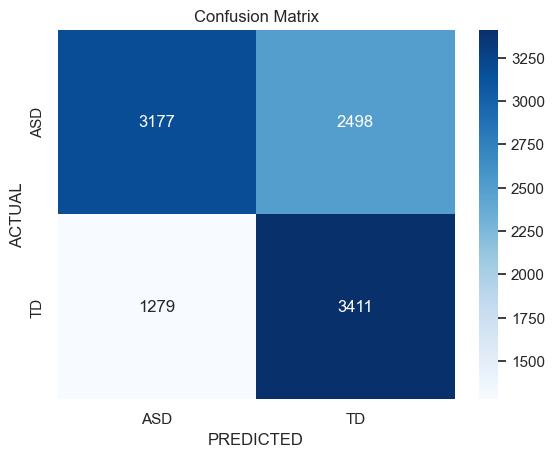


=======================================> PLOTS <=========================================


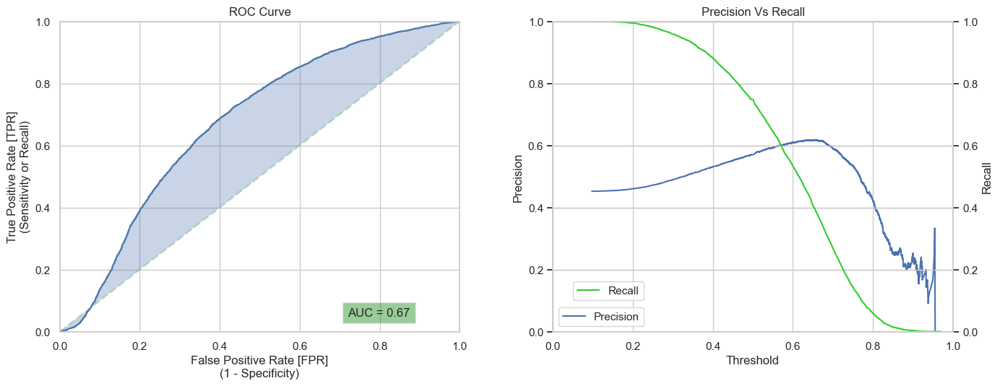

In [44]:
params_SVM2 = execute_optimization_SVM("SVM3", trials=50, X_train=X_train, y_train=y_train)
params_SVM2

svm_clf_tuned_2 = SVC(**params_SVM2, probability=True,
              class_weight='balanced', random_state=42)

# Fit the final model
svm_clf_tuned_2.fit(X_train, y_train);

svm_clf_tuned_2, svm_report_tuned_2 = report(svm_clf_tuned_2, X_train, y_train,
                                             X_test, y_test,
                                             display_scores=[primary_eval_metric],
                                             importance_plot=False,
                                             feature_labels=feature_names,
                                             confusion_labels=confusion_lbs)

### Model comparison

In [45]:
# Model comparison
report_list = [xgb_report_default,
              # xgb_report_tuned_1, 
               xgb_report_tuned_2,
               svm_report,
                #svm_report_tuned_1, 
                svm_report_tuned_2
                ]

clf_labels = ['XGBoost with default params',
              #'XGBoost after 10 trials',
              'XGBoost after 50 trials', 
              'SVM with default parameters',
              #'SVM after 10 trials',
              'SVM after 50 trials']

In [64]:
compare_table, compare_plot = compare_models(y_test, clf_reports=report_list,
                                             labels=clf_labels,
                                             score=primary_eval_metric.__name__)

compare_table

,Train f1_score,Test f1_score,Overfitting,ROC Area,Precision,Recall,F1-score,Support
XGBoost with default params,0.884,0.604,True,0.646639,0.556234,0.660128,0.603744,4690.0
XGBoost after 50 trials,0.777,0.645,True,0.672408,0.570796,0.741791,0.645155,4690.0
SVM with default parameters,0.669,0.652,True,0.690558,0.588721,0.730064,0.651818,4690.0
SVM after 50 trials,0.645,0.644,True,0.673172,0.577255,0.727292,0.643646,4690.0


In [65]:

# try adding the hyperprameters to the table
hyperparameters = {
    'XGBoost with default params': "default XGB",
   # 'XGBoost after 10 trials': params1,
    'XGBoost after 50 trials': params2,
    'SVM with default parameters': "default SVM",
   # 'SVM after 10 trials': params_SVM1,
    'SVM after 50 trials': params_SVM2,
}

compare_table['Hyperparameters'] = compare_table.index.map(hyperparameters)

def format_hyperparams(hyperparam_value):
    if isinstance(hyperparam_value, dict):
        return ', '.join([f"{key}: {round(value, 3) if isinstance(value, (int, float)) else value}"
                          for key, value in hyperparam_value.items()])
    return hyperparam_value

# Apply the formatted hyperparameters to the table
compare_table['Hyperparameters'] = compare_table.index.map(
    lambda model: format_hyperparams(hyperparameters.get(model, "")))

In [66]:
compare_table

,Train f1_score,Test f1_score,Overfitting,ROC Area,Precision,Recall,F1-score,Support,Hyperparameters
XGBoost with default params,0.884,0.604,True,0.646639,0.556234,0.660128,0.603744,4690.0,default XGB
XGBoost after 50 trials,0.777,0.645,True,0.672408,0.570796,0.741791,0.645155,4690.0,"learning_rate: 0.034, max_depth: 7, min_child_..."
SVM with default parameters,0.669,0.652,True,0.690558,0.588721,0.730064,0.651818,4690.0,default SVM
SVM after 50 trials,0.645,0.644,True,0.673172,0.577255,0.727292,0.643646,4690.0,"C: 6.208, gamma: auto, kernel: rbf"


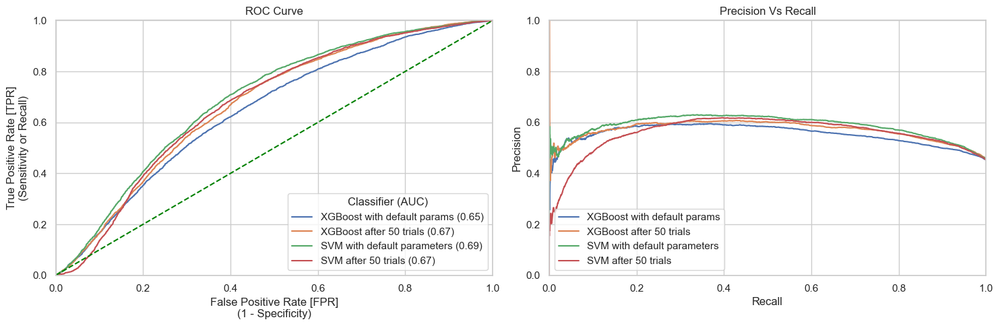

In [47]:
compare_plot

In [48]:
import os

#save it
compare_table.to_csv(os.path.join('..', 'out', 'compare_table_all_new.csv'), index=True, mode='w', header=True)  

In [67]:

#make it pretty with GT
from great_tables import GT, md, html

# remove F1 column
compare_table = compare_table.drop(columns=['F1-score'])

# give the index a name
compare_table_reset = compare_table.reset_index()
compare_table_reset.rename(columns={"index": "Model"}, inplace=True)


# group by model
compare_table_reset['Model Group'] = compare_table_reset['Model'].apply(
    lambda x: 'XGBoost' if 'XGBoost' in x else 'SVM'
)

compare_table_formatted = (
    GT(compare_table_reset, rowname_col="Model", groupname_col="Model Group")  # Specify "Model Group" as the group column
    .tab_header(
        title=html("<strong>Model Comparison</strong>"),
        subtitle=html("Evaluation of models before and after optimization.")
    )
    .tab_spanner(
        label=md("*Evaluation Metrics*"),
        columns=["Train f1_score", "Test f1_score", "Overfitting"]
    )
    .tab_spanner(
        label=md("*Performance Metrics*"),
        columns=["ROC Area", "Precision", "Recall", "Support"]
    )
    .fmt_number(columns=["Train f1_score", "Test f1_score", "ROC Area", "Precision", "Recall", "F1-score"], decimals=3)  # Format numeric columns to 3 decimals
    .tab_source_note(
        source_note="Before and after Bayesian Optimization - 50 trials"
    )
)

GT.show(compare_table_formatted)

GT.save(compare_table_formatted, "../out/model_comparison_GT.pdf")




Model Comparison 
 
 
 Evaluation of models before and after optimization. 
 
 
 
 
 Evaluation Metrics 
 
 
 Performance Metrics 
 
 Hyperparameters 
 
 
 Train f1_score 
 Test f1_score 
 Overfitting 
 ROC Area 
 Precision 
 Recall 
 Support 
 
 
 
 
 XGBoost 
 
 
 XGBoost with default params 
 0.884 
 0.604 
 True 
 0.647 
 0.556 
 0.660 
 4690.0 
 default XGB 
 
 
 XGBoost after 50 trials 
 0.777 
 0.645 
 True 
 0.672 
 0.571 
 0.742 
 4690.0 
 learning_rate: 0.034, max_depth: 7, min_child_weight: 0.546, subsample: 0.982, colsample_bytree: 0.936 
 
 
 SVM 
 
 
 SVM with default parameters 
 0.669 
 0.652 
 True 
 0.691 
 0.589 
 0.730 
 4690.0 
 default SVM 
 
 
 SVM after 50 trials 
 0.645 
 0.644 
 True 
 0.673 
 0.577 
 0.727 
 4690.0 
 C: 6.208, gamma: auto, kernel: rbf 
 
 
 
 
 
 Before and after Bayesian Optimization - 50 trials

# Fit the splittet datasets

#### Try with one function

In [35]:
import numpy as np
import pandas as pd
from sklearn.svm import SVC
from sklearn.model_selection import KFold, cross_val_predict, StratifiedKFold
from sklearn.metrics import f1_score
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler
import joblib
import os
from xgboost import XGBClassifier
from scipy import stats

test_predictions_svm = []
test_predictions_xgboost = []

# Function to calculate the binomial standard error
# use this: https://stats.stackexchange.com/questions/29641/standard-error-for-the-mean-of-a-sample-of-binomial-random-variables/29644#29644
def binomial_standard_error(p, n, k=1):
    """
    Calculate the standard error for a binomial distribution.
    """
    q = 1 - p  # Failure probability, p is the probability of success
    return np.sqrt((k * p * q) / n)  # n is number of samples, k can be set to one for bernouli trials (0 or 1) 



def perform_5_fold_cv(X, y, model_type, **model_params):
    """
    Perform 5-fold cross-validation and return the average F1 score.
    """
    kf = StratifiedKFold(n_splits=5,shuffle=True,random_state=1)  # Define KFold
    
    if model_type == 'svm':
        pipeline = Pipeline([
            ('scaler', MinMaxScaler()), # scale within the CV-folds 
            ('svm', SVC(**model_params, class_weight='balanced'))
        ])
    elif model_type == 'xgboost':
        pipeline = Pipeline([
            ('scaler', MinMaxScaler()), # scale within the CV-folds 
            ('xgboost', XGBClassifier(**model_params, scale_pos_weight=cls_weight,
                                random_state=0, n_jobs=-1))
        ])
    else:
        raise ValueError("Model type must be 'svm' or 'xgboost'")
    
    
    # Perform cross-validation and get predictions
    y_pred_cv = cross_val_predict(pipeline, X, y, cv=kf, n_jobs=None)
    
    # calculate F1 scores for each fold
    f1_scores = []
    
    for train_index, test_index in kf.split(X, y):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        
        pipeline.fit(X_train, y_train)
        y_pred_fold = pipeline.predict(X_test)
        f1_fold = f1_score(y_test, y_pred_fold, average='weighted')   # hard voting! 
        f1_scores.append(f1_fold)

    # calculate mean and 95% CI of F1 scores
    f1_mean = np.mean(f1_scores)
    f1_ci = stats.t.interval(0.95, len(f1_scores) - 1, loc=f1_mean, scale=stats.sem(f1_scores))
    
    #round to 2 decimals, and make sure it's a float
    return round(float(f1_mean), 4), (round(float(f1_ci[0]), 4), round(float(f1_ci[1]), 4)), y_pred_cv




def fit_and_evaluate_model(X_train, y_train, X_test, y_test, model_type, dataset_type, visit_num, **model_params):
    """
    Fit the specified model on the training data and evaluate it on the test data.
    
    Returns:
        Dictionary containing F1 scores for training (CV) and testing with binomial standard error.
    """
    # Perform 5-fold CV to get F1 score on training data
    f1_train, ci_train, y_pred_cv = perform_5_fold_cv(X_train, y_train, model_type, **model_params)

    # Create and fit the model on the whole training data
    if model_type == 'svm':
        pipeline = Pipeline([
            ('scaler', MinMaxScaler()),
            ('svm', SVC(**model_params, class_weight='balanced'))
        ])
        predictions_list = test_predictions_svm  

    elif model_type == 'xgboost':
        pipeline = Pipeline([
            ('scaler', MinMaxScaler()),
            ('xgboost', XGBClassifier(**model_params, scale_pos_weight=cls_weight,
                                       random_state=42, n_jobs=-1))
        ])
        predictions_list = test_predictions_xgboost  
    else:
        raise ValueError("Model type must be 'svm' or 'xgboost'")
    
    pipeline.fit(X_train, y_train)
    
    # Evaluate the model on test data and calculate F1 score
    y_pred_test = pipeline.predict(X_test)
    f1_test = f1_score(y_test, y_pred_test, average='weighted')
    f1_test = round(float(f1_test), 4)


    print(f"F1 score test: {f1_test}")  # print the performance on test
    print(f"F1 score train: {f1_train} with 95% CI: {ci_train}")  # print the performance train


    # binomial standard error for the test set predictions
    p = f1_test  # proportion of successes (for class 1) - we use f1-score
    n = len(y_test)  # length of test set
    binomial_se = binomial_standard_error(p, n)  # binomial standard error
    print(f"Binomial Standard Error: {binomial_se:.4f}")


    # Save the trained model
    model_name = f'model_{dataset_type.lower()}_participants_{visit_num}.pkl'
    joblib.dump(pipeline, os.path.join('..','models', model_name))
    
    # save the test predictions for the error analysis - we want the index, so we can merge with the demographics data
    for idx, true_val in zip(y_test.index, y_test):
        predictions_list.append({
            'Visit': visit_num,
            'Dataset': dataset_type,
            'Model': model_type,
            'Index': idx,
            'Predictions': y_pred_test[y_test.index.get_loc(idx)],
            'True': np.int64(true_val)
        })

    return {
        'F1_CV_Train': f1_train,
        'F1_Test': f1_test,
        'CI_Train': ci_train,
        'Binomial_SE': binomial_se
    }


def train_and_evaluate(splits_same, splits_new, model_type, **model_params):
    """
    Train and evaluate specified models on 12 datasets (6 from each visit on same participants, 6 on new participants).
    
    Parameters:
        model_type: Type of model to use ('svm' or 'xgboost')
        model_params: Additional parameters for the model
    """
    f1_results = []  # Store results for all datasets
    
    # Prepare datasets for same participants
    for i in range(1, 7):
        print(f"Training and evaluating on same participants from visit {i}")
        X_train_same = splits_same[f'visit_{i}']['X_train']
        y_train_same = splits_same[f'visit_{i}']['y_train']
        X_test_same = splits_same[f'visit_{i}']['X_test']
        y_test_same = splits_same[f'visit_{i}']['y_test']
        
        metrics = fit_and_evaluate_model(X_train_same, y_train_same, X_test_same, y_test_same, model_type, "Same", i, **model_params)
        metrics['Dataset'] = f'Same_Participants_{i}'
        metrics['Visit'] = i
        metrics['Type'] = "Same"
        f1_results.append(metrics)
    
    # Prepare datasets for new participants
    for i in range(1, 7):
        print(f"Training and evaluating on new participants from visit {i}")
        X_train_new = splits_new[f'visit_{i}']['X_train']
        y_train_new = splits_new[f'visit_{i}']['y_train']
        X_test_new = splits_new[f'visit_{i}']['X_test']
        y_test_new = splits_new[f'visit_{i}']['y_test']
        
        metrics = fit_and_evaluate_model(X_train_new, y_train_new, X_test_new, y_test_new, model_type, "New", i, **model_params)
        metrics['Dataset'] = f'New_Participants_{i}'
        metrics['Visit'] = i
        metrics['Type'] = "New"
        f1_results.append(metrics)
    
    f1_df = pd.DataFrame(f1_results)  # convert to df
    f1_df.to_csv(os.path.join('..', 'out', f'f1_results_new_{model_type.upper()}.csv'), index=False, mode='w', header=True)    

    return f1_df


### XGBoost!

In [28]:
# Overall: 


In [36]:

# For XGBoost
f1_results_xgb = train_and_evaluate(splits_same, splits_new, 'xgboost', **params2)


Training and evaluating on same participants from visit 1
F1 score test: 0.6147
F1 score train: 0.7046 with 95% CI: (0.6981, 0.7111)
Binomial Standard Error: 0.0051
Training and evaluating on same participants from visit 2
F1 score test: 0.6222
F1 score train: 0.6931 with 95% CI: (0.6876, 0.6987)
Binomial Standard Error: 0.0046
Training and evaluating on same participants from visit 3
F1 score test: 0.6298
F1 score train: 0.6971 with 95% CI: (0.6946, 0.6996)
Binomial Standard Error: 0.0049
Training and evaluating on same participants from visit 4
F1 score test: 0.6721
F1 score train: 0.6968 with 95% CI: (0.6926, 0.701)
Binomial Standard Error: 0.0047
Training and evaluating on same participants from visit 5
F1 score test: 0.6688
F1 score train: 0.6973 with 95% CI: (0.693, 0.7015)
Binomial Standard Error: 0.0047
Training and evaluating on same participants from visit 6
F1 score test: 0.6535
F1 score train: 0.6955 with 95% CI: (0.6927, 0.6984)
Binomial Standard Error: 0.0049
Training and

In [37]:
f1_results_xgb

,F1_CV_Train,F1_Test,CI_Train,Binomial_SE,Dataset,Visit,Type
0,0.7046,0.6147,"(0.6981, 0.7111)",0.005136,Same_Participants_1,1,Same
1,0.6931,0.6222,"(0.6876, 0.6987)",0.004564,Same_Participants_2,2,Same
2,0.6971,0.6298,"(0.6946, 0.6996)",0.004882,Same_Participants_3,3,Same
3,0.6968,0.6721,"(0.6926, 0.701)",0.004729,Same_Participants_4,4,Same
4,0.6973,0.6688,"(0.693, 0.7015)",0.004704,Same_Participants_5,5,Same
5,0.6955,0.6535,"(0.6927, 0.6984)",0.004891,Same_Participants_6,6,Same
6,0.7103,0.5509,"(0.7073, 0.7133)",0.011502,New_Participants_1,1,New
7,0.6974,0.5821,"(0.6909, 0.7038)",0.011990,New_Participants_2,2,New
8,0.7053,0.6029,"(0.6965, 0.714)",0.011829,New_Participants_3,3,New
9,0.7088,0.6648,"(0.7054, 0.7121)",0.011466,New_Participants_4,4,New


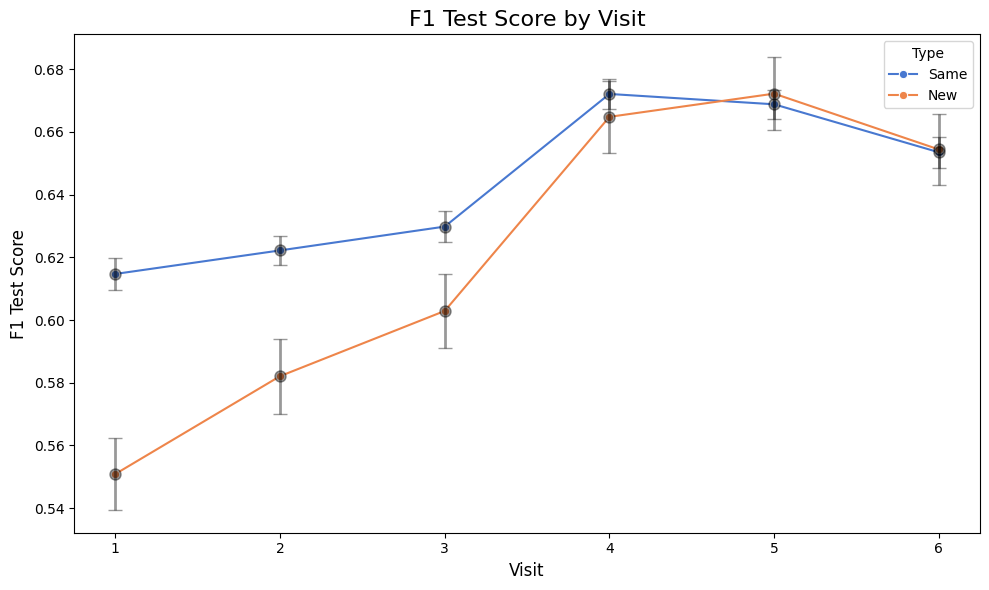

In [38]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(10, 6))

sns.lineplot(data=f1_results_xgb, x='Visit', y='F1_Test', hue='Type', marker='o', dashes=False, palette='muted')

# Add error bars directly using the 'Binomial_SE' as the error
for i in range(len(f1_results_xgb)):
    plt.errorbar(
        x=f1_results_xgb['Visit'].iloc[i],
        y=f1_results_xgb['F1_Test'].iloc[i],
        yerr=f1_results_xgb['Binomial_SE'].iloc[i],  # Binomial Standard Error
        fmt='o', color='black', capsize=5, elinewidth=2, markersize=8, alpha=0.4
    )

# Title and labels
plt.title('F1 Test Score by Visit', fontsize=16)
plt.xlabel('Visit', fontsize=12)
plt.ylabel('F1 Test Score', fontsize=12)

# Add legend
plt.legend(title='Type')

# Adjust layout to ensure everything fits
plt.tight_layout()  
plt.show()


### SVM!

In [31]:
f1_results_svm = train_and_evaluate(splits_same, splits_new, 'svm', **params_SVM2)

Training and evaluating on same participants from visit 1
F1 score test: 0.5877
F1 score train: 0.6303 with 95% CI: (0.6219, 0.6387)
Binomial Standard Error: 0.0052
Training and evaluating on same participants from visit 2
F1 score test: 0.5785
F1 score train: 0.6288 with 95% CI: (0.6236, 0.6341)
Binomial Standard Error: 0.0046
Training and evaluating on same participants from visit 3
F1 score test: 0.6228
F1 score train: 0.6233 with 95% CI: (0.6169, 0.6296)
Binomial Standard Error: 0.0049
Training and evaluating on same participants from visit 4
F1 score test: 0.6497
F1 score train: 0.6171 with 95% CI: (0.6114, 0.6228)
Binomial Standard Error: 0.0048
Training and evaluating on same participants from visit 5
F1 score test: 0.6381
F1 score train: 0.6174 with 95% CI: (0.6084, 0.6263)
Binomial Standard Error: 0.0048
Training and evaluating on same participants from visit 6
F1 score test: 0.5934
F1 score train: 0.6204 with 95% CI: (0.614, 0.6267)
Binomial Standard Error: 0.0050
Training an

In [32]:
f1_results_svm

,F1_CV_Train,F1_Test,CI_Train,Binomial_SE,Dataset,Visit,Type
0,0.6303,0.5877,"(0.6219, 0.6387)",0.005195,Same_Participants_1,1,Same
1,0.6288,0.5785,"(0.6236, 0.6341)",0.004648,Same_Participants_2,2,Same
2,0.6233,0.6228,"(0.6169, 0.6296)",0.004901,Same_Participants_3,3,Same
3,0.6171,0.6497,"(0.6114, 0.6228)",0.004806,Same_Participants_4,4,Same
4,0.6174,0.6381,"(0.6084, 0.6263)",0.004803,Same_Participants_5,5,Same
5,0.6204,0.5934,"(0.614, 0.6267)",0.005049,Same_Participants_6,6,Same
6,0.6279,0.5413,"(0.6203, 0.6355)",0.011523,New_Participants_1,1,New
7,0.6272,0.5935,"(0.6185, 0.6358)",0.011941,New_Participants_2,2,New
8,0.6226,0.6317,"(0.6154, 0.6298)",0.011661,New_Participants_3,3,New
9,0.6141,0.6437,"(0.612, 0.6162)",0.011632,New_Participants_4,4,New


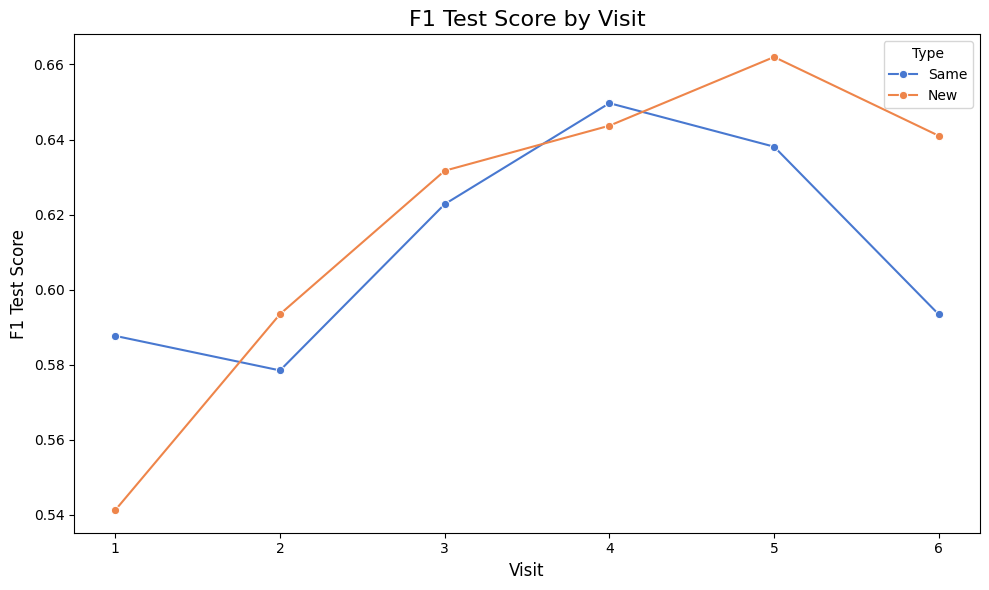

In [33]:
import seaborn as sns
import matplotlib.pyplot as plt

#make a simple plot for illustration

plt.figure(figsize=(10, 6))
sns.lineplot(data=f1_results_svm, x='Visit', y='F1_Test', hue='Type', marker='o', dashes=False, palette='muted')

plt.title('F1 Test Score by Visit', fontsize=16)
plt.xlabel('Visit', fontsize=12)
plt.ylabel('F1 Test Score', fontsize=12)

plt.legend(title='Type')

plt.tight_layout()  
plt.show()

### Visualize both together

In [39]:
f1_results_xgb['Model'] = 'XGBoost'  
f1_results_svm['Model'] = 'SVM'

combined_data = pd.concat([f1_results_xgb, f1_results_svm])
combined_data


,F1_CV_Train,F1_Test,CI_Train,Binomial_SE,Dataset,Visit,Type,Model
0,0.7046,0.6147,"(0.6981, 0.7111)",0.005136,Same_Participants_1,1,Same,XGBoost
1,0.6931,0.6222,"(0.6876, 0.6987)",0.004564,Same_Participants_2,2,Same,XGBoost
2,0.6971,0.6298,"(0.6946, 0.6996)",0.004882,Same_Participants_3,3,Same,XGBoost
3,0.6968,0.6721,"(0.6926, 0.701)",0.004729,Same_Participants_4,4,Same,XGBoost
4,0.6973,0.6688,"(0.693, 0.7015)",0.004704,Same_Participants_5,5,Same,XGBoost
5,0.6955,0.6535,"(0.6927, 0.6984)",0.004891,Same_Participants_6,6,Same,XGBoost
6,0.7103,0.5509,"(0.7073, 0.7133)",0.011502,New_Participants_1,1,New,XGBoost
7,0.6974,0.5821,"(0.6909, 0.7038)",0.011990,New_Participants_2,2,New,XGBoost
8,0.7053,0.6029,"(0.6965, 0.714)",0.011829,New_Participants_3,3,New,XGBoost
9,0.7088,0.6648,"(0.7054, 0.7121)",0.011466,New_Participants_4,4,New,XGBoost


/var/folders/_f/m8yjfgz94dqdsmyf6j7_y6s40000gn/T/ipykernel_26740/4046141483.py:22: UserWarning: The palette list has more values (9) than needed (2), which may not be intended.
  sns.lineplot(data=plot_data, x='Visit', y='F1_Test', hue='Model',
/var/folders/_f/m8yjfgz94dqdsmyf6j7_y6s40000gn/T/ipykernel_26740/4046141483.py:22: UserWarning: The palette list has more values (9) than needed (2), which may not be intended.
  sns.lineplot(data=plot_data, x='Visit', y='F1_Test', hue='Model',


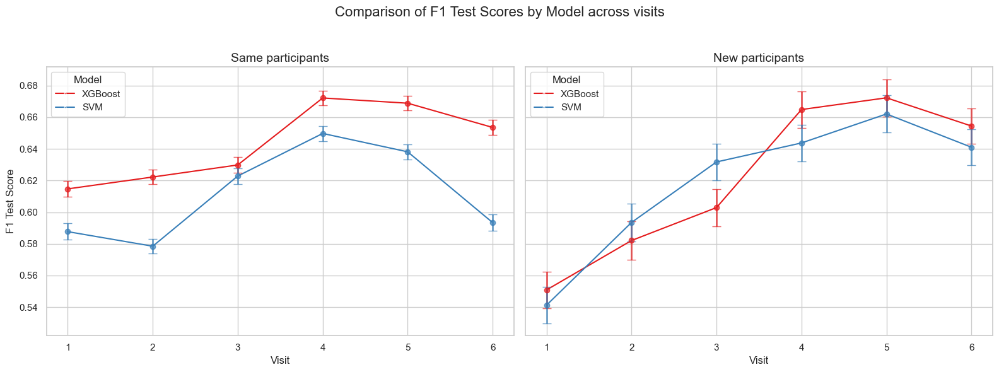

In [40]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the plot style
sns.set(style='whitegrid')

# Create a figure with two subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 6), sharey=True)

# types and titles for each subplot
types = ['Same', 'New']
titles = ['Same participants', 'New participants']

#  color palette and model names
palette = sns.color_palette("Set1")
models = combined_data['Model'].unique()

# loop through both subplots
for i, (ax, data_type, title) in enumerate(zip(axes, types, titles)):
    # Filter data and plot the main lines
    plot_data = combined_data[combined_data['Type'] == data_type]
    sns.lineplot(data=plot_data, x='Visit', y='F1_Test', hue='Model', 
                 marker='o', dashes=False, palette=palette, ax=ax, markersize=2)
    
    # Add matching error bars
    for color, model in zip(palette, models):
        model_data = plot_data[plot_data['Model'] == model]
        ax.errorbar(model_data['Visit'], model_data['F1_Test'], yerr=model_data['Binomial_SE'], 
                    fmt='o', color=color, capsize=5, elinewidth=2, markersize=6, alpha=0.7)
    
    # Set titles and labels for the subplots
    ax.set_title(title, fontsize=14)
    ax.set_xlabel('Visit', fontsize=12)
    if i == 0:
        ax.set_ylabel('F1 Test Score', fontsize=12)
    ax.legend(title='Model')

# Add a main title and adjust layout
fig.suptitle('Comparison of F1 Test Scores by Model across visits', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


/var/folders/_f/m8yjfgz94dqdsmyf6j7_y6s40000gn/T/ipykernel_26740/3363964891.py:16: UserWarning: The palette list has more values (9) than needed (2), which may not be intended.
  sns.lineplot(data=new_data, x='Visit', y='F1_Test', hue='Model',


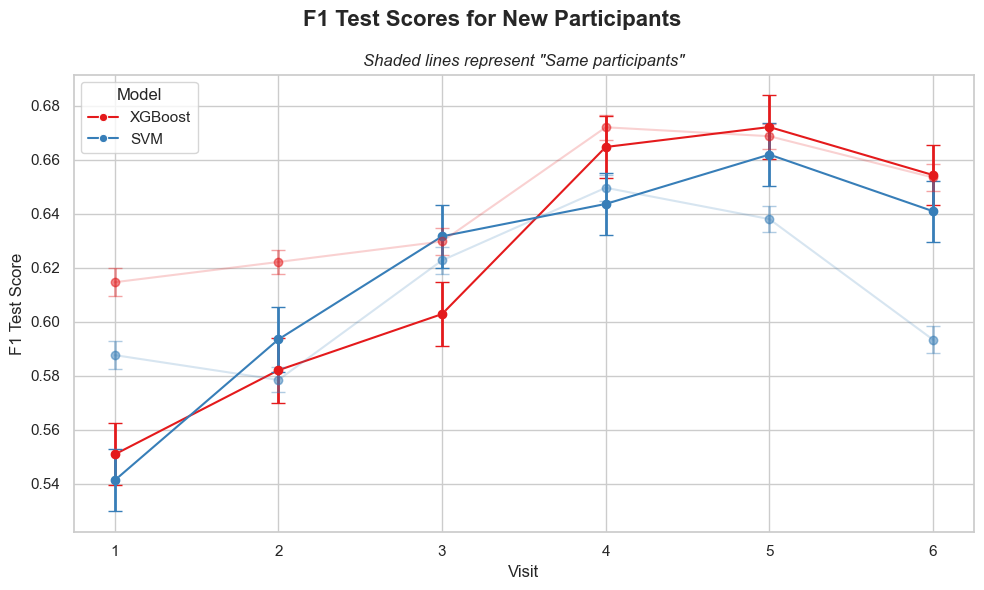

In [42]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the plot style
sns.set(style='whitegrid')

# Create a single plot
fig, ax = plt.subplots(figsize=(10, 6))

# Define color palette and unique models
palette = sns.color_palette("Set1")
models = combined_data['Model'].unique()

# Plot the "New" participants data prominently
new_data = combined_data[combined_data['Type'] == 'New']
sns.lineplot(data=new_data, x='Visit', y='F1_Test', hue='Model', 
             marker='o', dashes=False, palette=palette, ax=ax, markersize=6)

# Add error bars for the "New" participants
for color, model in zip(palette, models):
    model_data_new = new_data[new_data['Model'] == model]
    ax.errorbar(model_data_new['Visit'], model_data_new['F1_Test'], 
                yerr=model_data_new['Binomial_SE'], fmt='o', color=color, 
                capsize=5, elinewidth=2, markersize=6)

# Overlay the "Same" participants data with reduced opacity
same_data = combined_data[combined_data['Type'] == 'Same']
for color, model in zip(palette, models):
    model_data_same = same_data[same_data['Model'] == model]
    ax.plot(model_data_same['Visit'], model_data_same['F1_Test'], 
            marker='o', color=color, alpha=0.2)
    ax.errorbar(model_data_same['Visit'], model_data_same['F1_Test'], 
                yerr=model_data_same['Binomial_SE'], fmt='o', color=color, 
                capsize=5, elinewidth=2, alpha=0.4)

# Set the main title with enough space above the plot
ax.set_title('Shaded lines represent "Same participants"', fontsize=12, fontstyle='italic')

# Add the subtitle below the title
fig.suptitle('F1 Test Scores for New Participants', 
             fontsize=16, weight='bold')

# Set axis labels
ax.set_xlabel('Visit', fontsize=12)
ax.set_ylabel('F1 Test Score', fontsize=12)

# Adjust the legend to only include the model names
handles, labels = ax.get_legend_handles_labels()
unique_labels = {model: handles[i] for i, model in enumerate(models)}
ax.legend(unique_labels.values(), unique_labels.keys(), title='Model', loc='upper left')

# Adjust layout and display the plot with more space for the title and subtitle
plt.subplots_adjust(top=0.85)  # This ensures there's enough space at the top
plt.tight_layout()  # Ensures tight layout
plt.show()


## Try some kind of error analysis
### Look at the predictions on a participant level

#### XGBoost!

In [159]:
#test_predictions_xgboost

In [324]:
# see the predictions: 
predictions_df = pd.DataFrame(test_predictions_xgboost)

same_predictions = predictions_df[predictions_df['Dataset'] == 'Same'].reset_index(drop=True)
new_predictions = predictions_df[predictions_df['Dataset'] == 'New'].reset_index(drop=True)
new_predictions

,Visit,Dataset,Model,Index,Predictions,True
0,1,New,xgboost,959,0,1
1,1,New,xgboost,960,1,1
2,1,New,xgboost,961,0,1
3,1,New,xgboost,962,0,1
4,1,New,xgboost,963,0,1
...,...,...,...,...,...,...
10360,6,New,xgboost,58510,1,1
10361,6,New,xgboost,58511,1,1
10362,6,New,xgboost,58512,1,1
10363,6,New,xgboost,58513,1,1


In [325]:
# merge based on the index column 
new_clean = clean_data.copy()
new_clean.reset_index(inplace=True) # create a column from the index
new_clean.rename(columns={'index': 'Index'}, inplace=True)
merged_df_new = new_predictions.merge(new_clean, on='Index', how='left')
merged_df_new

,Visit_x,Dataset,Model,Index,Predictions,True,Participant,Visit_y,Duration,ASD,...,slopeUV500-1500_sma3nz_amean,spectralFluxUV_sma3nz_amean,loudnessPeaksPerSec,VoicedSegmentsPerSec,MeanVoicedSegmentLengthSec,StddevVoicedSegmentLengthSec,MeanUnvoicedSegmentLength,StddevUnvoicedSegmentLength,equivalentSoundLevel_dBp,ExpressiveLangRaw1
0,1,New,xgboost,959,0,1,6,1,9.47,1.0,...,0.002455,0.086996,2.219873,0.212540,0.245000,0.175000,4.440000,4.150000,-35.252716,27.0
1,1,New,xgboost,960,1,1,6,1,2.95,1.0,...,0.001390,0.085400,3.401361,1.730104,0.172000,0.079095,0.320000,0.300943,-31.792812,27.0
2,1,New,xgboost,961,0,1,6,1,2.17,1.0,...,-0.000692,0.189068,1.851852,1.904762,0.090000,0.052440,0.415000,0.592516,-26.554579,27.0
3,1,New,xgboost,962,0,1,6,1,199.00,1.0,...,-0.015791,0.126200,3.030303,1.554404,0.356667,0.265121,0.266667,0.074087,-29.943476,27.0
4,1,New,xgboost,963,0,1,6,1,92.00,1.0,...,-0.010976,0.160642,3.296703,2.325582,0.190000,0.100000,0.143333,0.106562,-32.171810,27.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10360,6,New,xgboost,58510,1,1,65,6,8.79,1.0,...,-0.018643,0.415390,2.277905,3.321879,0.166207,0.191823,0.131600,0.182618,-19.058750,30.0
10361,6,New,xgboost,58511,1,1,65,6,188.00,1.0,...,-0.016954,0.590992,3.208556,2.762431,0.136000,0.111642,0.206000,0.148943,-18.686260,30.0
10362,6,New,xgboost,58512,1,1,65,6,136.00,1.0,...,-0.020860,0.647426,3.703704,3.076923,0.232500,0.256259,0.072500,0.058041,-17.153826,30.0
10363,6,New,xgboost,58513,1,1,65,6,12.70,1.0,...,-0.005895,0.205796,2.364066,1.424051,0.231667,0.192101,0.450556,0.849395,-21.940796,30.0


In [326]:
import pandas as pd
import numpy as np
from scipy import stats

needed_columns = ['Participant', 'Visit_x', 'Dataset', 'Model', 'Predictions', 'True', 'ExpressiveLangRaw1', 'ADOS1', 'Duration', 'Age']
filtered_df_new = merged_df_new[needed_columns]

# calculate most frequent prediction and probability
def calculate_prediction_stats(subgroup):
    mode_value = subgroup['Predictions'].mode()[0]
    probability = (subgroup['Predictions'] == mode_value).sum() / len(subgroup)
    correct = mode_value == subgroup['True'].mode()[0]
    return pd.Series({
        'Predictions': mode_value,
        'True': subgroup['True'].mode()[0],
        'Correct': correct,
        'Probability': probability,
        'Model': subgroup['Model'].iloc[0],
        'Dataset': subgroup['Dataset'].iloc[0],
        'ExpressiveLangRaw1': subgroup['ExpressiveLangRaw1'].iloc[0],
        'ADOS1': subgroup['ADOS1'].iloc[0],
        'Duration': subgroup['Duration'].mean(),
        'Age': subgroup['Age'].iloc[0]

    })

# Apply the function to each group and reset the index
grouped_predictions_new = filtered_df_new.groupby(['Participant', 'Visit_x']).apply(calculate_prediction_stats).reset_index()

print(grouped_predictions_new.to_string())


    Participant  Visit_x  Predictions  True  Correct  Probability    Model Dataset  ExpressiveLangRaw1  ADOS1   Duration    Age
0             5        1            1     0    False     0.827273  xgboost     New                15.0    0.0  51.699545  19.23
1             5        2            0     0     True     0.639175  xgboost     New                15.0    0.0  33.950309    NaN
2             5        3            1     0    False     0.504854  xgboost     New                15.0    0.0  53.728350  27.27
3             5        4            0     0     True     0.804196  xgboost     New                15.0    0.0  51.447483  31.20
4             5        5            0     0     True     0.808824  xgboost     New                15.0    0.0  58.064853  35.63
5             5        6            0     0     True     0.866667  xgboost     New                15.0    0.0  58.925200  40.27
6             6        1            0     1    False     0.700000  xgboost     New                27.0  

/var/folders/_f/m8yjfgz94dqdsmyf6j7_y6s40000gn/T/ipykernel_51703/1715975823.py:28: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  grouped_predictions_new = filtered_df_new.groupby(['Participant', 'Visit_x']).apply(calculate_prediction_stats).reset_index()


In [327]:
# try per visit
summary_counts = grouped_predictions_new.groupby('Visit_x').agg(
    Correct_Count=('Correct', 'sum'),          # correct predictions
    Incorrect_Count=('Correct', lambda x: (~x).sum()),  # incorrect predictions
    Duration = ('Duration', 'mean')
).reset_index()

print(summary_counts)

   Visit_x  Correct_Count  Incorrect_Count   Duration
0        1              7                5  57.224345
1        2              6                5  52.056692
2        3              7                4  57.645741
3        4              8                3  61.530582
4        5              8                2  61.313794
5        6              7                4  64.008121


In [430]:

# now do it without the visits
grouped_predictions_new_participant = grouped_predictions_new.groupby(['Participant']).agg({
    'Correct': lambda x: x.value_counts().idxmax(),  # most common prediction
    'Predictions': lambda x: x.value_counts().idxmax(),  
    'True': lambda x: x.value_counts().idxmax(), 
   # 'Model': 'first',  
   # 'Dataset': 'first',
    'ExpressiveLangRaw1': 'first',
    'ADOS1': 'first',
    'Probability': 'mean',
    'Age': 'first',
    'Duration': 'mean'
}).reset_index()


# Make it pretty with great_tables
from great_tables import GT, md, html

# replace 0 with 'TD' and 1 with 'ASD' 
grouped_predictions_new_participant[['Correct', 'Predictions', 'True']] = (
    grouped_predictions_new_participant[['Correct', 'Predictions', 'True']].replace({0: 'TD', 1: 'ASD'})
)

grouped_predictions_new_participant= grouped_predictions_new_participant.sort_values(by=['Predictions', 'Probability'])

predictions_GT = (
    GT(grouped_predictions_new_participant, rowname_col="Participant", groupname_col="Correct")
    .tab_spanner(label=md("*Prediction Results*"), columns=["Predictions", "True", "Probability"])
    .tab_spanner(label=md("*Participant Details*"), columns=["ExpressiveLangRaw1", "ADOS1", "Age"])
    .tab_header(
        title=html("<strong>Participant-Level Prediction Summary</strong>"),
        subtitle=html("XGBoost performance on new participants"),
    )
    .cols_label(
        Correct="Correct Prediction",
        Predictions="Prediction",
        #True="True Label",
        #Model="Model Type",
        #Dataset="Dataset Name",
        ExpressiveLangRaw1="Expressive Language (Raw)",
        ADOS1="ADOS Score",
        Probability="Average Probability",
        Age="Age (months)",
        Duration = "Duration (s)"
    )
    .fmt_number(columns=["Probability", "Duration"], decimals=2)
    .fmt_integer(columns=["ExpressiveLangRaw1", "ADOS1", "Age"])
    .tab_source_note(source_note="Note: Participant details are from visit 1")
)

GT.show(predictions_GT)

GT.save(predictions_GT, "../out/predictions_GT.pdf")

# 8/12 is correct! - 75 %



Participant-Level Prediction Summary 
 
 
 XGBoost performance on new participants 
 
 
 
 
 Prediction Results 
 
 
 Participant Details 
 
 Duration (s) 
 
 
 Prediction 
 True 
 Average Probability 
 Expressive Language (Raw) 
 ADOS Score 
 Age (months) 
 
 
 
 
 True 
 
 
 11 
 ASD 
 ASD 
 0.64 
 17 
 15 
 30 
 72.08 
 
 
 32 
 ASD 
 ASD 
 0.65 
 19 
 14 
 27 
 52.95 
 
 
 61 
 ASD 
 ASD 
 0.70 
 11 
 14 
 36 
 40.33 
 
 
 35 
 ASD 
 ASD 
 0.86 
 14 
 17 
 35 
 47.02 
 
 
 65 
 ASD 
 ASD 
 0.90 
 30 
 13 
 34 
 82.41 
 
 
 5 
 TD 
 TD 
 0.74 
 15 
 0 
 19 
 51.30 
 
 
 20 
 TD 
 TD 
 0.76 
 33 
 0 
 21 
 59.52 
 
 
 53 
 TD 
 TD 
 0.86 
 27 
 0 
 23 
 52.12 
 
 
 False 
 
 
 64 
 ASD 
 TD 
 0.67 
 22 
 4 
 21 
 52.29 
 
 
 24 
 ASD 
 TD 
 0.72 
 18 
 0 
 18 
 66.80 
 
 
 41 
 ASD 
 TD 
 0.78 
 13 
 3 
 19 
 64.03 
 
 
 6 
 TD 
 ASD 
 0.66 
 27 
 13 
 29 
 65.47 
 
 
 
 
 
 Note: Participant details are from visit 1

Python(8910) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(8931) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


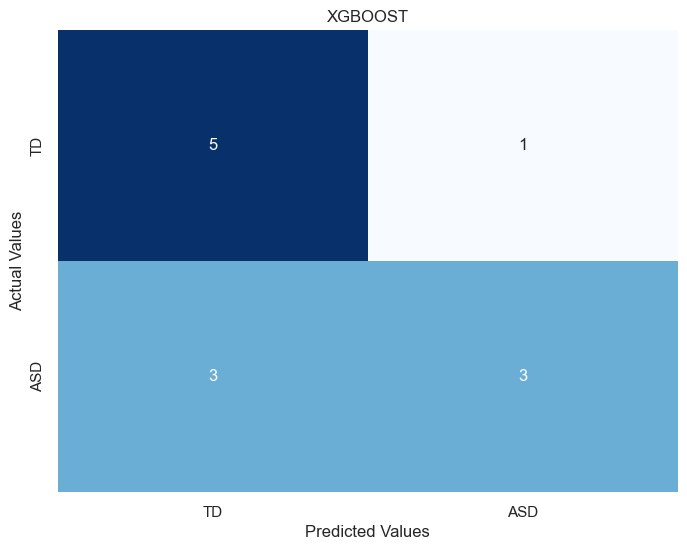

In [329]:
from sklearn.metrics import confusion_matrix

#make confusion matrix: 
y_true = grouped_predictions_new_participant['True']
y_pred = grouped_predictions_new_participant['Predictions']
cm = confusion_matrix(y_true, y_pred)
cm_df = pd.DataFrame(cm, index=['TD', 'ASD'], columns=['TD', 'ASD'])

plt.figure(figsize=(8, 6))
sns.heatmap(cm_df, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('XGBOOST')
plt.ylabel('Actual Values')
plt.xlabel('Predicted Values')
plt.show()

In [337]:
grouped_predictions_new_participant

,Participant,Correct,Predictions,True,ExpressiveLangRaw1,ADOS1,Probability,Age,Duration
2,11,True,ASD,ASD,17.0,15.0,0.640561,29.87,72.084744
5,32,True,ASD,ASD,19.0,14.0,0.646006,27.37,52.951322
10,64,False,ASD,TD,22.0,4.0,0.674587,20.80,52.288536
9,61,True,ASD,ASD,11.0,14.0,0.700297,35.50,40.328785
4,24,False,ASD,TD,18.0,0.0,0.721360,18.40,66.804064
7,41,False,ASD,TD,13.0,3.0,0.776145,19.20,64.031886
6,35,True,ASD,ASD,14.0,17.0,0.862743,34.87,47.019247
11,65,True,ASD,ASD,30.0,13.0,0.896069,34.00,82.407849
1,6,False,TD,ASD,27.0,13.0,0.657374,28.80,65.467156
0,5,True,TD,TD,15.0,0.0,0.741831,19.23,51.302623


In [339]:
# Point-Biserial Correlation - to see the relationship between binary and continuous measures
# is there an association between symptom severity and classification error?

# should I maybe make two?? One for the ASD and TD group??
# That would make it easier to interpret

import scipy.stats as stats

ASD_pred = grouped_predictions_new_participant[grouped_predictions_new_participant['True'] == 'ASD'].reset_index(drop=True)
TD_pred = grouped_predictions_new_participant[grouped_predictions_new_participant['True'] == 'TD'].reset_index(drop=True)

print("For ADOS:")
pb_correlation_asd, pb_pvalue_asd = stats.pointbiserialr(ASD_pred['Correct'], ASD_pred['ADOS1'])
print(f"Point-Biserial Correlation for ASD: {pb_correlation_asd}, p-value: {pb_pvalue_asd}")


pb_correlation_td, pb_pvalue_td = stats.pointbiserialr(TD_pred['Correct'], TD_pred['ADOS1'])
print(f"Point-Biserial Correlation for TD: {pb_correlation_td}, p-value: {pb_pvalue_td}")

#  weak positive correlation between ADOS scores and correct classification for asd - but not significant
#  stronger negative correlation between ADOS scores and correct classification for td - but not significant

print("________________")
print("For expressive language:")
pb_correlation_asd, pb_pvalue_asd = stats.pointbiserialr(ASD_pred['Correct'], ASD_pred['ExpressiveLangRaw1'])
print(f"Point-Biserial Correlation for ASD: {pb_correlation_asd}, p-value: {pb_pvalue_asd}")


pb_correlation_td, pb_pvalue_td = stats.pointbiserialr(TD_pred['Correct'], TD_pred['ExpressiveLangRaw1'])
print(f"Point-Biserial Correlation for TD: {pb_correlation_td}, p-value: {pb_pvalue_td}")

#  weak negative correlation between expressive language scores and correct classification for asd - but not significant
#  stronger positive correlation between expressive language scores and correct classification for td - but not significant


For ADOS:
Point-Biserial Correlation for ASD: 0.4338609156373123, p-value: 0.39004259507460204
Point-Biserial Correlation for TD: -0.6965260331469925, p-value: 0.1241702355478412
________________
For expressive language:
Point-Biserial Correlation for ASD: -0.48413073294922776, p-value: 0.33053980245204856
Point-Biserial Correlation for TD: 0.5280168968110514, p-value: 0.28158069685040144


In [340]:
# mean difference in ados scores for the correctly and incorrectly classified
correct_ados = ASD_pred[ASD_pred['Correct'] == True]['ADOS1']
incorrect_ados = ASD_pred[ASD_pred['Correct'] == False]['ADOS1']

correct_ados_td = TD_pred[TD_pred['Correct'] == True]['ADOS1']
incorrect_ados_td = TD_pred[TD_pred['Correct'] == False]['ADOS1']

# T-test
t_stat_ASD, p_value_ASD = stats.ttest_ind(correct_ados, incorrect_ados)
t_stat_td, p_value_td = stats.ttest_ind(correct_ados_td, incorrect_ados_td)

print(f"T-test for ASD and ADOS: t-statistic = {t_stat}, p-value = {p_value}")

print("Mean ADOS score for the correctly classified in the ASD group:", correct_ados.mean())
print("Mean ADOS score for the incorrectly classified in the ASD group:", incorrect_ados.mean())

print("Mean ADOS score for the correctly classified in the TD group:", correct_ados_td.mean())
print("Mean ADOS score for the incorrectly classified in the TD group:", incorrect_ados_td.mean())

print("____________________")
print("For expressive language:")

# mean difference in expressive language  for the correctly and incorrectly classified
correct_explang = ASD_pred[ASD_pred['Correct'] == True]['ExpressiveLangRaw1']
incorrect_explang = ASD_pred[ASD_pred['Correct'] == False]['ExpressiveLangRaw1']

correct_explang_td = TD_pred[TD_pred['Correct'] == True]['ExpressiveLangRaw1']
incorrect_explang_td = TD_pred[TD_pred['Correct'] == False]['ExpressiveLangRaw1']

t_stat_exp_ASD, p_value_exp_ASD = stats.ttest_ind(correct_explang, incorrect_explang)
t_stat_exp_td, p_value_exp_td = stats.ttest_ind(correct_explang_td, incorrect_explang_td)



print(f"T-test for ASD and expressive language: t-statistic = {t_stat}, p-value = {p_value}")

print("Mean expressive language for the correctly classified in the ASD group:", correct_explang.mean())
print("Mean expressive language for the incorrectly classified in the ASD group:", incorrect_explang.mean())

print("Mean expressive language for the correctly classified in the TD group:", correct_explang_td.mean())
print("Mean expressive language for the incorrectly classified in the TD group:", incorrect_explang_td.mean())


# explore duration
print("____________________")
print("For duration on a participant level:")

grouped_duration = grouped_predictions_new_participant.groupby(['True', 'Correct']).agg(
    Duration = ('Duration', 'mean'),
    ExpressiveLanguage = ('ExpressiveLangRaw1', 'mean'),
    ADOS = ('ADOS1', 'mean'),
    Age = ('Age', 'first')
).reset_index()

print(grouped_duration)


T-test for ASD and ADOS: t-statistic = 1.243513521677287, p-value = 0.3043188973436354
Mean ADOS score for the correctly classified in the ASD group: 14.6
Mean ADOS score for the incorrectly classified in the ASD group: 13.0
Mean ADOS score for the correctly classified in the TD group: 0.0
Mean ADOS score for the incorrectly classified in the TD group: 2.3333333333333335
____________________
For expressive language:
T-test for ASD and expressive language: t-statistic = 1.243513521677287, p-value = 0.3043188973436354
Mean expressive language for the correctly classified in the ASD group: 18.2
Mean expressive language for the incorrectly classified in the ASD group: 27.0
Mean expressive language for the correctly classified in the TD group: 25.0
Mean expressive language for the incorrectly classified in the TD group: 17.666666666666668
____________________
For duration on a participant level:
  True  Correct   Duration  ExpressiveLanguage       ADOS    Age
0  ASD    False  65.467156     

In [341]:
ASD_pred

,Participant,Correct,Predictions,True,ExpressiveLangRaw1,ADOS1,Probability,Age,Duration
0,11,True,ASD,ASD,17.0,15.0,0.640561,29.87,72.084744
1,32,True,ASD,ASD,19.0,14.0,0.646006,27.37,52.951322
2,61,True,ASD,ASD,11.0,14.0,0.700297,35.50,40.328785
3,35,True,ASD,ASD,14.0,17.0,0.862743,34.87,47.019247
4,65,True,ASD,ASD,30.0,13.0,0.896069,34.00,82.407849
5,6,False,TD,ASD,27.0,13.0,0.657374,28.80,65.467156


In [342]:
grouped_predictions_new

,Participant,Visit_x,Predictions,True,Correct,Probability,Model,Dataset,ExpressiveLangRaw1,ADOS1,Duration,Age
0,5,1,1,0,False,0.827273,xgboost,New,15.0,0.0,51.699545,19.23
1,5,2,0,0,True,0.639175,xgboost,New,15.0,0.0,33.950309,NaN
2,5,3,1,0,False,0.504854,xgboost,New,15.0,0.0,53.728350,27.27
3,5,4,0,0,True,0.804196,xgboost,New,15.0,0.0,51.447483,31.20
4,5,5,0,0,True,0.808824,xgboost,New,15.0,0.0,58.064853,35.63
...,...,...,...,...,...,...,...,...,...,...,...,...
61,65,2,1,1,True,0.794444,xgboost,New,30.0,13.0,85.495111,38.63
62,65,3,1,1,True,0.869281,xgboost,New,30.0,13.0,71.592941,42.47
63,65,4,1,1,True,0.857143,xgboost,New,30.0,13.0,93.046743,47.00
64,65,5,1,1,True,0.986014,xgboost,New,30.0,13.0,67.569720,51.13


5    65.467156
Name: Duration, dtype: float64

In [429]:
from great_tables import GT, md, html
from great_tables import GT, from_column, style, loc
import pandas as pd
from scipy import stats

# Define datasets for durations
correct_duration = ASD_pred[ASD_pred['Correct'] == True]['Duration']
incorrect_duration = ASD_pred[ASD_pred['Correct'] == False]['Duration']
correct_duration_td = TD_pred[TD_pred['Correct'] == True]['Duration']
incorrect_duration_td = TD_pred[TD_pred['Correct'] == False]['Duration']

# Function to format mean and standard deviation
def format_mean_sd_safe(series):
    non_na_series = series.dropna()
    if non_na_series.empty:
        return "N/A"
    elif len(non_na_series) == 1:
        return f"{non_na_series.iloc[0]:.2f} (N/A)"  # Single instance, no SD
    else:
        mean = non_na_series.mean()
        sd = non_na_series.std()
        return f"{mean:.2f} ({sd:.2f})"

# Add mean and SD for each group
combined_data = {
    "Group": ["ASD", "TD", "ASD", "TD", "ASD", "TD"],
    "Score Type": [
        "ADOS Score", "ADOS Score",
        "Expressive Language", "Expressive Language",
        "Duration (s)", "Duration (s)"
    ],
    "Correctly Classified": [
        format_mean_sd_safe(correct_ados),
        format_mean_sd_safe(correct_ados_td),
        format_mean_sd_safe(correct_explang),
        format_mean_sd_safe(correct_explang_td),
        format_mean_sd_safe(correct_duration),
        format_mean_sd_safe(correct_duration_td)
    ],
    "Incorrectly Classified": [
        format_mean_sd_safe(incorrect_ados),
        format_mean_sd_safe(incorrect_ados_td),
        format_mean_sd_safe(incorrect_explang),
        format_mean_sd_safe(incorrect_explang_td),
        format_mean_sd_safe(incorrect_duration),
        format_mean_sd_safe(incorrect_duration_td)
    ]
}

# Convert data to DataFrame and handle missing values
combined_df = pd.DataFrame(combined_data).fillna("N/A")

# Create the updated table
combined_table = (
    GT(combined_df, rowname_col="Score Type", groupname_col="Group")
    .tab_spanner(label=md("*Mean Group Scores*"), columns=["Correctly Classified", "Incorrectly Classified"])
    .tab_header(
        title=html("<strong>Mean Differences</strong>"),
        subtitle=html("Mean ADOS, Expressive Language, and Duration for correctly and incorrectly classified participants")
    )
    .cols_align(
        columns=["Correctly Classified"], align="left"
    )  # Align Correctly Classified to the left
    .cols_align(
        columns=["Incorrectly Classified"], align="left"
    )  # Align Incorrectly Classified to the right
    .tab_source_note(source_note="Note: Visit 1 scores for ADOS and Expressive language.")
    .tab_source_note(source_note="Note: SD is in parenthesis (NA's for just a single instance)")
)

# Show and save the table
GT.show(combined_table)
GT.save(combined_table, "../out/mean_difference_with_sd_GT.pdf")


Mean Differences 
 
 
 Mean ADOS, Expressive Language, and Duration for correctly and incorrectly classified participants 
 
 
 
 
 Mean Group Scores 
 
 
 
 Correctly Classified 
 Incorrectly Classified 
 
 
 
 
 ASD 
 
 
 ADOS Score 
 14.60 (1.52) 
 13.00 (N/A) 
 
 
 Expressive Language 
 18.20 (7.26) 
 27.00 (N/A) 
 
 
 Duration (s) 
 58.96 (17.66) 
 65.47 (N/A) 
 
 
 TD 
 
 
 ADOS Score 
 0.00 (0.00) 
 2.33 (2.08) 
 
 
 Expressive Language 
 25.00 (9.17) 
 17.67 (4.51) 
 
 
 Duration (s) 
 54.31 (4.53) 
 61.04 (7.71) 
 
 
 
 
 
 Note: Visit 1 scores for ADOS and Expressive language. 
 


 
 Note: SD is in parenthesis (NA's for just a single instance)

Python(8729) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(8750) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


### SVM - error analysis

In [108]:
#test_predictions_svm

In [109]:
# see the predictions: 
predictions_df_svm = pd.DataFrame(test_predictions_svm)

same_predictions_svm = predictions_df_svm[predictions_df_svm['Dataset'] == 'Same'].reset_index(drop=True)
new_predictions_svm = predictions_df_svm[predictions_df_svm['Dataset'] == 'New'].reset_index(drop=True)
new_predictions_svm

,Visit,Dataset,Model,Index,Predictions,True
0,1,New,svm,959,0.0,1
1,1,New,svm,960,0.0,1
2,1,New,svm,961,1.0,1
3,1,New,svm,962,0.0,1
4,1,New,svm,963,0.0,1
...,...,...,...,...,...,...
10360,6,New,svm,58510,1.0,1
10361,6,New,svm,58511,1.0,1
10362,6,New,svm,58512,1.0,1
10363,6,New,svm,58513,1.0,1


In [110]:
# merge based on the index column 
# we have new_clean from XGB
merged_df_new_svm = new_predictions_svm.merge(new_clean, on='Index', how='left')
merged_df_new_svm

,Visit_x,Dataset,Model,Index,Predictions,True,Participant,Visit_y,Duration,ASD,...,slopeUV500-1500_sma3nz_amean,spectralFluxUV_sma3nz_amean,loudnessPeaksPerSec,VoicedSegmentsPerSec,MeanVoicedSegmentLengthSec,StddevVoicedSegmentLengthSec,MeanUnvoicedSegmentLength,StddevUnvoicedSegmentLength,equivalentSoundLevel_dBp,ExpressiveLangRaw1
0,1,New,svm,959,0.0,1,6,1,9.47,1.0,...,0.002455,0.086996,2.219873,0.212540,0.245000,0.175000,4.440000,4.150000,-35.252716,27.0
1,1,New,svm,960,0.0,1,6,1,2.95,1.0,...,0.001390,0.085400,3.401361,1.730104,0.172000,0.079095,0.320000,0.300943,-31.792812,27.0
2,1,New,svm,961,1.0,1,6,1,2.17,1.0,...,-0.000692,0.189068,1.851852,1.904762,0.090000,0.052440,0.415000,0.592516,-26.554579,27.0
3,1,New,svm,962,0.0,1,6,1,199.00,1.0,...,-0.015791,0.126200,3.030303,1.554404,0.356667,0.265121,0.266667,0.074087,-29.943476,27.0
4,1,New,svm,963,0.0,1,6,1,92.00,1.0,...,-0.010976,0.160642,3.296703,2.325582,0.190000,0.100000,0.143333,0.106562,-32.171810,27.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10360,6,New,svm,58510,1.0,1,65,6,8.79,1.0,...,-0.018643,0.415390,2.277905,3.321879,0.166207,0.191823,0.131600,0.182618,-19.058750,30.0
10361,6,New,svm,58511,1.0,1,65,6,188.00,1.0,...,-0.016954,0.590992,3.208556,2.762431,0.136000,0.111642,0.206000,0.148943,-18.686260,30.0
10362,6,New,svm,58512,1.0,1,65,6,136.00,1.0,...,-0.020860,0.647426,3.703704,3.076923,0.232500,0.256259,0.072500,0.058041,-17.153826,30.0
10363,6,New,svm,58513,1.0,1,65,6,12.70,1.0,...,-0.005895,0.205796,2.364066,1.424051,0.231667,0.192101,0.450556,0.849395,-21.940796,30.0


In [112]:

import pandas as pd
import numpy as np
from scipy import stats

needed_columns = ['Participant', 'Visit_x', 'Dataset', 'Model', 'Predictions', 'True', 'ExpressiveLangRaw1', 'ADOS1', 'Duration']
filtered_df_new_svm = merged_df_new_svm[needed_columns]

# do it on a participant and visit level - add a correct column and a probability column
grouped_predictions_new_svm = filtered_df_new_svm.groupby(['Participant', 'Visit_x']).apply(calculate_prediction_stats).reset_index()

print(grouped_predictions_new_svm.to_string())



    Participant  Visit_x  Predictions  True  Correct  Probability Model Dataset  ExpressiveLangRaw1  ADOS1   Duration
0             5        1          1.0     0    False     0.536364   svm     New                15.0    0.0  51.699545
1             5        2          0.0     0     True     0.783505   svm     New                15.0    0.0  33.950309
2             5        3          0.0     0     True     0.766990   svm     New                15.0    0.0  53.728350
3             5        4          0.0     0     True     0.902098   svm     New                15.0    0.0  51.447483
4             5        5          0.0     0     True     0.830882   svm     New                15.0    0.0  58.064853
5             5        6          0.0     0     True     0.880000   svm     New                15.0    0.0  58.925200
6             6        1          0.0     1    False     0.746667   svm     New                27.0   13.0  55.561267
7             6        2          0.0     1    False    

/var/folders/_f/m8yjfgz94dqdsmyf6j7_y6s40000gn/T/ipykernel_51703/689836926.py:9: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  grouped_predictions_new_svm = filtered_df_new_svm.groupby(['Participant', 'Visit_x']).apply(calculate_prediction_stats).reset_index()


In [113]:
# try per visit
summary_counts_svm = grouped_predictions_new_svm.groupby('Visit_x').agg(
    Correct_Count=('Correct', 'sum'),          # correct predictions
    Incorrect_Count=('Correct', lambda x: (~x).sum()) # incorrect predictions
).reset_index()

print(summary_counts_svm)

   Visit_x  Correct_Count  Incorrect_Count
0        1              6                6
1        2              6                5
2        3              8                3
3        4              7                4
4        5              8                2
5        6              8                3


In [114]:
# now do it without the visits
grouped_predictions_new_participant_svm = grouped_predictions_new_svm.groupby(['Participant']).agg({
    'Correct': lambda x: x.value_counts().idxmax(),  # most common prediction
    'Predictions': lambda x: x.value_counts().idxmax(),  
    'True': lambda x: x.value_counts().idxmax(), 
    'Model': 'first',  
    'Dataset': 'first',
    'ExpressiveLangRaw1': 'first',
    'ADOS1': 'first',  
    'Probability': 'mean'
}).reset_index()
grouped_predictions_new_participant_svm

# 5 out of 12!

,Participant,Correct,Predictions,True,Model,Dataset,ExpressiveLangRaw1,ADOS1,Probability
0,5,True,0.0,0,svm,New,15.0,0.0,0.783307
1,6,False,0.0,1,svm,New,27.0,13.0,0.689637
2,11,True,1.0,1,svm,New,17.0,15.0,0.701593
3,20,True,0.0,0,svm,New,33.0,0.0,0.726245
4,24,False,1.0,0,svm,New,18.0,0.0,0.771732
5,32,True,1.0,1,svm,New,19.0,14.0,0.721564
6,35,True,1.0,1,svm,New,14.0,17.0,0.917321
7,41,False,1.0,0,svm,New,13.0,3.0,0.846153
8,53,True,0.0,0,svm,New,27.0,0.0,0.880004
9,61,False,0.0,1,svm,New,11.0,14.0,0.646217


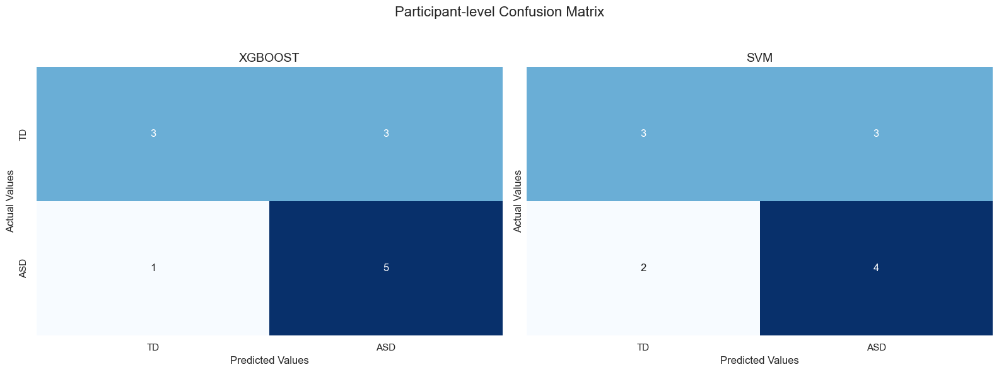

In [115]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

fig, axes = plt.subplots(1, 2, figsize=(16, 6), sharey=True)

# XGB confusion matrix
y_true_xgb = grouped_predictions_new_participant['True']
y_pred_xgb = grouped_predictions_new_participant['Predictions']
cm_xgb = confusion_matrix(y_true_xgb, y_pred_xgb)
cm_df_xgb = pd.DataFrame(cm_xgb, index=['TD', 'ASD'], columns=['TD', 'ASD'])

sns.heatmap(cm_df_xgb, annot=True, fmt='d', cmap='Blues', cbar=False, ax=axes[0])
axes[0].set_title('XGBOOST', fontsize=14)
axes[0].set_xlabel('Predicted Values', fontsize=12)
axes[0].set_ylabel('Actual Values', fontsize=12)

# SVM confusion matrix
y_true_svm = grouped_predictions_new_participant_svm['True']
y_pred_svm = grouped_predictions_new_participant_svm['Predictions']
cm_svm = confusion_matrix(y_true_svm, y_pred_svm)
cm_df_svm = pd.DataFrame(cm_svm, index=['TD', 'ASD'], columns=['TD', 'ASD'])

sns.heatmap(cm_df_svm, annot=True, fmt='d', cmap='Blues', cbar=False, ax=axes[1])
axes[1].set_title('SVM', fontsize=14)
axes[1].set_xlabel('Predicted Values', fontsize=12)
axes[1].set_ylabel('Actual Values', fontsize=12)

fig.suptitle('Participant-level Confusion Matrix', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to fit main title
plt.show()


In [116]:

ASD_pred_svm = grouped_predictions_new_participant_svm[grouped_predictions_new_participant_svm['True'] == 1].reset_index(drop=True)
TD_pred_svm = grouped_predictions_new_participant_svm[grouped_predictions_new_participant_svm['True'] == 0].reset_index(drop=True)

print("For ADOS:")
pb_correlation_asd, pb_pvalue_asd = stats.pointbiserialr(ASD_pred_svm['Correct'], ASD_pred_svm['ADOS1'])
print(f"Point-Biserial Correlation for ASD: {pb_correlation_asd}, p-value: {pb_pvalue_asd}")


pb_correlation_td, pb_pvalue_td = stats.pointbiserialr(TD_pred_svm['Correct'], TD_pred_svm['ADOS1'])
print(f"Point-Biserial Correlation for TD: {pb_correlation_td}, p-value: {pb_pvalue_td}")

#  weak positive correlation between ADOS scores and correct classification for asd - but not significant
#  weak negative correlation between ADOS scores and correct classification for td -  not significant

print("________________")
print("For expressive language:")
pb_correlation_asd, pb_pvalue_asd = stats.pointbiserialr(ASD_pred_svm['Correct'], ASD_pred_svm['ExpressiveLangRaw1'])
print(f"Point-Biserial Correlation for ASD: {pb_correlation_asd}, p-value: {pb_pvalue_asd}")


pb_correlation_td, pb_pvalue_td = stats.pointbiserialr(TD_pred_svm['Correct'], TD_pred_svm['ExpressiveLangRaw1'])
print(f"Point-Biserial Correlation for TD: {pb_correlation_td}, p-value: {pb_pvalue_td}")

#  weak negative correlation between expressive language scores and correct classification for asd - but not significant
#  stronger positive correlation between expressive language scores and correct classification for td - but not significant


For ADOS:
Point-Biserial Correlation for ASD: 0.42874646285627216, p-value: 0.39628714972811663
Point-Biserial Correlation for TD: -0.6965260331469925, p-value: 0.1241702355478412
________________
For expressive language:
Point-Biserial Correlation for ASD: 0.0695889000639221, p-value: 0.8957851460301797
Point-Biserial Correlation for TD: 0.5280168968110515, p-value: 0.28158069685040127


In [117]:
# mean difference

# mean difference in ados scores for the correctly and incorrectly classified
correct_ados_svm = ASD_pred_svm[ASD_pred_svm['Correct'] == True]['ADOS1']
incorrect_ados_svm = ASD_pred_svm[ASD_pred_svm['Correct'] == False]['ADOS1']

correct_ados_td_svm = TD_pred_svm[TD_pred_svm['Correct'] == True]['ADOS1']
incorrect_ados_td_svm = TD_pred_svm[TD_pred_svm['Correct'] == False]['ADOS1']

# T-test
t_stat, p_value = stats.ttest_ind(correct_ados_svm, incorrect_ados_svm)
print(f"T-test for ASD and ADOS: t-statistic = {t_stat}, p-value = {p_value}")

print("Mean ADOS score for the correctly classified in the ASD group:", correct_ados_svm.mean())
print("Mean ADOS score for the incorrectly classified in the ASD group:", incorrect_ados_svm.mean())

print("Mean ADOS score for the correctly classified in the TD group:", correct_ados_td_svm.mean())
print("Mean ADOS score for the incorrectly classified in the TD group:", incorrect_ados_td_svm.mean())

print("____________________")
print("For expressive language:")

# mean difference in expressive language  for the correctly and incorrectly classified
correct_explang_svm = ASD_pred_svm[ASD_pred_svm['Correct'] == True]['ExpressiveLangRaw1']
incorrect_explang_svm = ASD_pred_svm[ASD_pred_svm['Correct'] == False]['ExpressiveLangRaw1']

correct_explang_td_svm = TD_pred_svm[TD_pred_svm['Correct'] == True]['ExpressiveLangRaw1']
incorrect_explang_td_svm = TD_pred_svm[TD_pred_svm['Correct'] == False]['ExpressiveLangRaw1']

t_stat, p_value = stats.ttest_ind(correct_explang, incorrect_explang)
print(f"T-test for ASD and expressive language: t-statistic = {t_stat}, p-value = {p_value}")

print("Mean expressive language for the correctly classified in the ASD group:", correct_explang_svm.mean())
print("Mean expressive language for the incorrectly classified in the ASD group:", incorrect_explang_svm.mean())

print("Mean expressive language for the correctly classified in the TD group:", correct_explang_td_svm.mean())
print("Mean expressive language for the incorrectly classified in the TD group:", incorrect_explang_td_svm.mean())



T-test for ASD and ADOS: t-statistic = 0.949157995752499, p-value = 0.39628714972811696
Mean ADOS score for the correctly classified in the ASD group: 14.75
Mean ADOS score for the incorrectly classified in the ASD group: 13.5
Mean ADOS score for the correctly classified in the TD group: 0.0
Mean ADOS score for the incorrectly classified in the TD group: 2.3333333333333335
____________________
For expressive language:
T-test for ASD and expressive language: t-statistic = -1.1065900006212852, p-value = 0.3305398024520485
Mean expressive language for the correctly classified in the ASD group: 20.0
Mean expressive language for the incorrectly classified in the ASD group: 19.0
Mean expressive language for the correctly classified in the TD group: 25.0
Mean expressive language for the incorrectly classified in the TD group: 17.666666666666668


# Random stuff

## SVM
-	Preprocessing - done
-	Splitting - done
-	Scaling (on each, so it hasn’t learned anything about the test). done
-	(maybe feature reduction). But probably not… 
-	Hyperparameters optimize on the full dataset - done
-	Cross validation - done
-	Error analysis - mhh how??n

### Fit

In [71]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.svm import SVC
from sklearn.pipeline import make_pipeline

# Create a pipeline with MinMaxScaler and SVM
pipeline = make_pipeline(MinMaxScaler(), SVC())

# Fit the pipeline to the training data
pipeline.fit(X_train, y_train)

# Evaluate on the test data
accuracy = pipeline.score(X_test, y_test)
print(f"Accuracy: {accuracy * 100:.2f}%")

# when not using the optimized hyperparameters I get an accuracy of 64.74 %. 

Accuracy: 64.74%


In [70]:
# try to fit it:
from sklearn.svm import SVC
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.pipeline import Pipeline


pipeline = Pipeline([
        ('scaler', MinMaxScaler()), 
        ('svm', SVC(C=1.497565403390054, kernel='rbf', gamma='auto')) # C=1.497565403390054, kernel='rbf', gamma='auto' : accuracy of 0.72
    ])
pipeline.fit(X_train, y_train)

prediction = pipeline.predict(X_test)

print(classification_report(y_test,prediction))
print(confusion_matrix(y_test, prediction))
print(accuracy_score(y_test, prediction))

# when using the optimized hyperparameters I get an accuracy of 0.63

              precision    recall  f1-score   support

         0.0       0.71      0.54      0.61      5675
         1.0       0.57      0.73      0.64      4690

    accuracy                           0.63     10365
   macro avg       0.64      0.64      0.63     10365
weighted avg       0.65      0.63      0.63     10365

[[3067 2608]
 [1260 3430]]
0.6268210323203087


In [55]:
sfsv

NameError: name 'sfsv' is not defined

## Fit XGBoost

Try to fit the XGBooost, so we get all the scores from the report function used in the optimization

In [43]:
import numpy as np
import pandas as pd
from sklearn.model_selection import KFold, cross_val_predict
from sklearn.metrics import f1_score
import joblib
import os
from xgboost import XGBClassifier


def fit_and_evaluate_model(X_train, y_train, X_test, y_test, model):
    """
    Fit the XGBoost model on the training data and evaluate it on the test data.
    """
    scaler = MinMaxScaler()

    # Fit the scaler on the X_train_sample data
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test) # add to test

    model.fit(X_train, y_train);

    xgb_clf_tuned_2, xgb_report_tuned_2 = report(model, X_train, y_train,
                                             X_test, y_test,
                                             display_scores=[primary_eval_metric],
                                             importance_plot=True,
                                             feature_labels=feature_names,
                                             confusion_labels=confusion_lbs)
    
    report_list = [xgb_report_tuned_2]
    clf_labels = ['XGBoost with 50 trials',]

    compare_table, compare_plot = compare_models(y_test, clf_reports=report_list,
                                             labels=clf_labels,
                                             score=primary_eval_metric.__name__)

    return compare_table


def train_and_evaluate(splits_same, splits_new, model):
    """
    Train and evaluate XGBoost models with specified hyperparameters on 12 datasets 
    (6 from each visit on same participants, 6 on new participants).
    """
    f1_results = []  # Store results for all datasets
    
    # Prepare datasets for same participants
    for i in range(1, 7):
        print(f"Training and evaluating on same participants from visit {i}")
        X_train = splits_same[f'visit_{i}']['X_train']
        y_train = splits_same[f'visit_{i}']['y_train']
        X_test = splits_same[f'visit_{i}']['X_test']
        y_test = splits_same[f'visit_{i}']['y_test']
        
        metrics = fit_and_evaluate_model(X_train, y_train, X_test, y_test, model)
        # Add identifying columns (Dataset, Visit, Type)
        metrics['Dataset'] = f'Same_Participants_{i}'
        metrics['Visit'] = i
        metrics['Type'] = "Same"
        f1_results.append(metrics)
    
    # Prepare datasets for new participants
    for i in range(1, 7):
        print(f"Training and evaluating on new participants from visit {i}")
        X_train = splits_new[f'visit_{i}']['X_train']
        y_train = splits_new[f'visit_{i}']['y_train']
        X_test = splits_new[f'visit_{i}']['X_test']
        y_test = splits_new[f'visit_{i}']['y_test']
        
        metrics = fit_and_evaluate_model(X_train, y_train, X_test, y_test, model)
        metrics['Dataset'] = f'New_Participants_{i}'
        metrics['Visit'] = i
        metrics['Type'] = "New"
        f1_results.append(metrics)
    
    # Convert results to DataFrame and save to CSV
    f1_df = pd.concat(f1_results, ignore_index=False)    
    f1_df.to_csv(os.path.join('..', 'out', 'f1_results_XGBoost2-new.csv'), index=False, mode='w', header=True)    

    return f1_df



Training and evaluating on same participants from visit 1
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8639508711258084, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.09266307881793942,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=8, max_leaves=None,
              min_child_weight=1.6750810285737576e-10, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=-1, num_parallel_tree=None, random_state=0, ...)

=============================> TRAIN-TEST DETAILS <======================================
Train Size: 50398 samples
 Test Size: 89

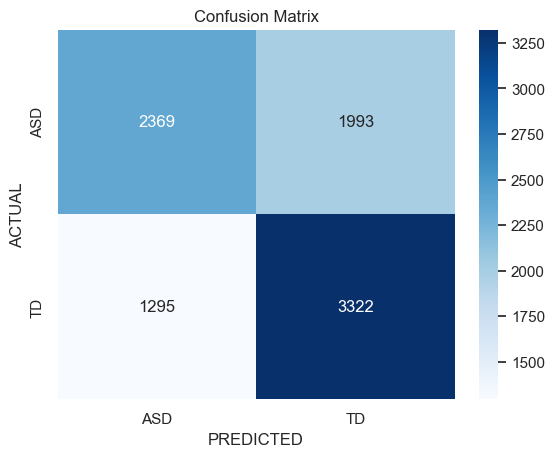


=======================================> PLOTS <=========================================


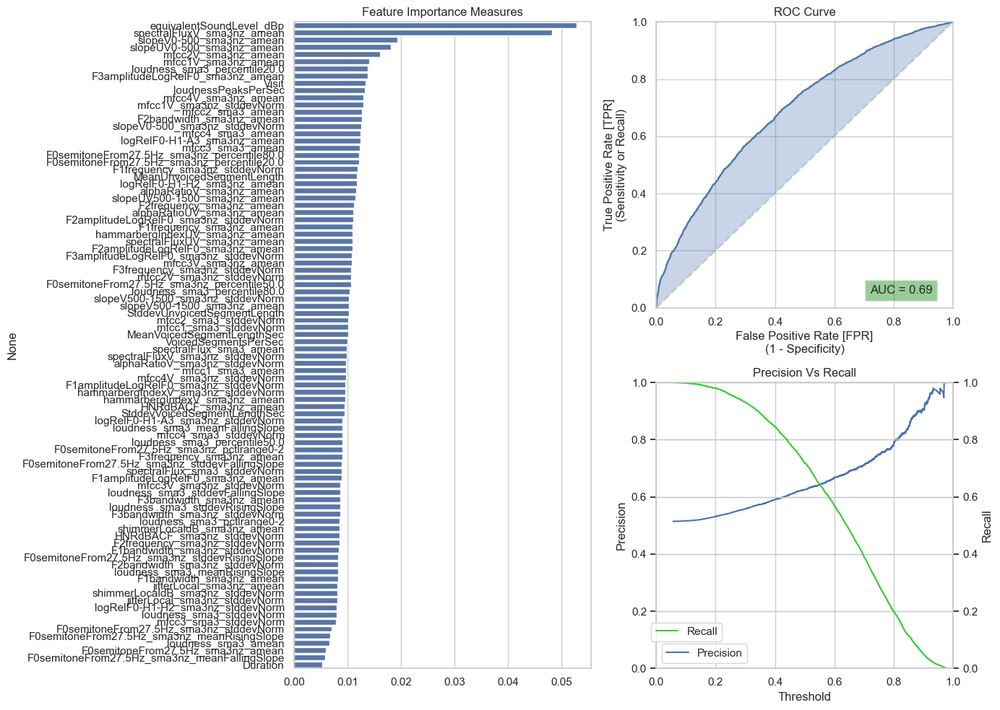

Training and evaluating on same participants from visit 2
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8639508711258084, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.09266307881793942,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=8, max_leaves=None,
              min_child_weight=1.6750810285737576e-10, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=-1, num_parallel_tree=None, random_state=0, ...)

=============================> TRAIN-TEST DETAILS <======================================
Train Size: 48090 samples
 Test Size: 11

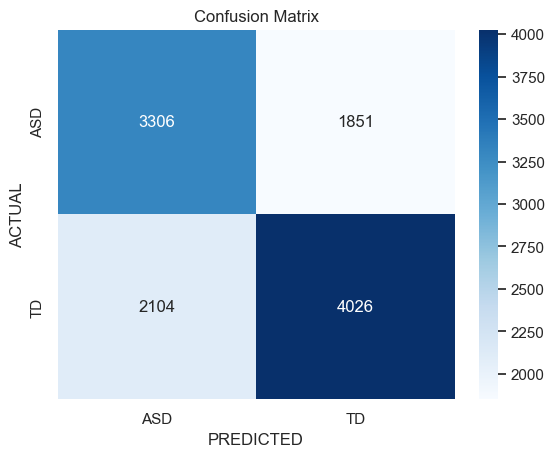


=======================================> PLOTS <=========================================


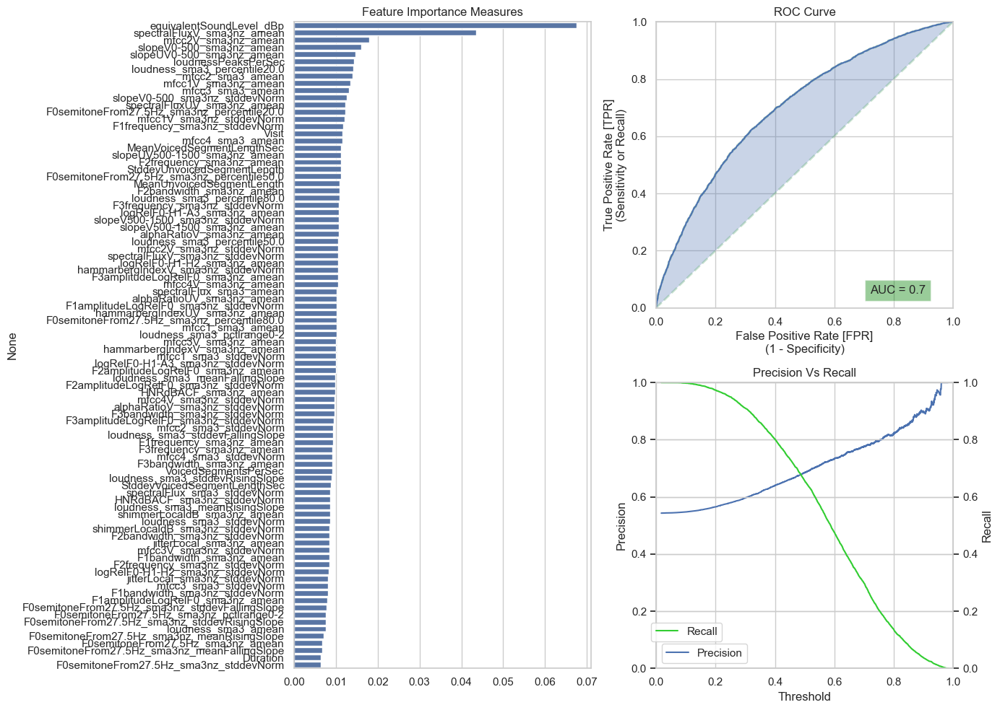

Training and evaluating on same participants from visit 3
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8639508711258084, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.09266307881793942,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=8, max_leaves=None,
              min_child_weight=1.6750810285737576e-10, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=-1, num_parallel_tree=None, random_state=0, ...)

=============================> TRAIN-TEST DETAILS <======================================
Train Size: 49596 samples
 Test Size: 97

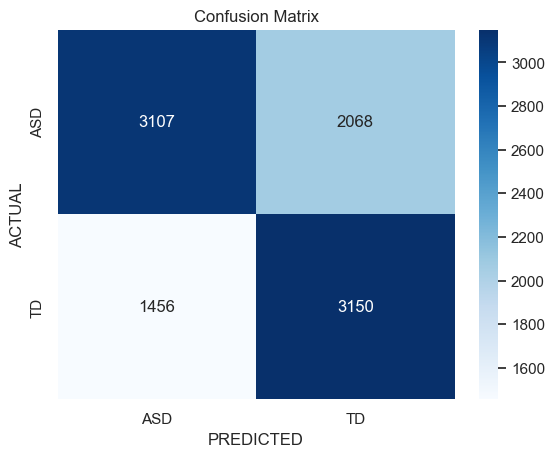


=======================================> PLOTS <=========================================


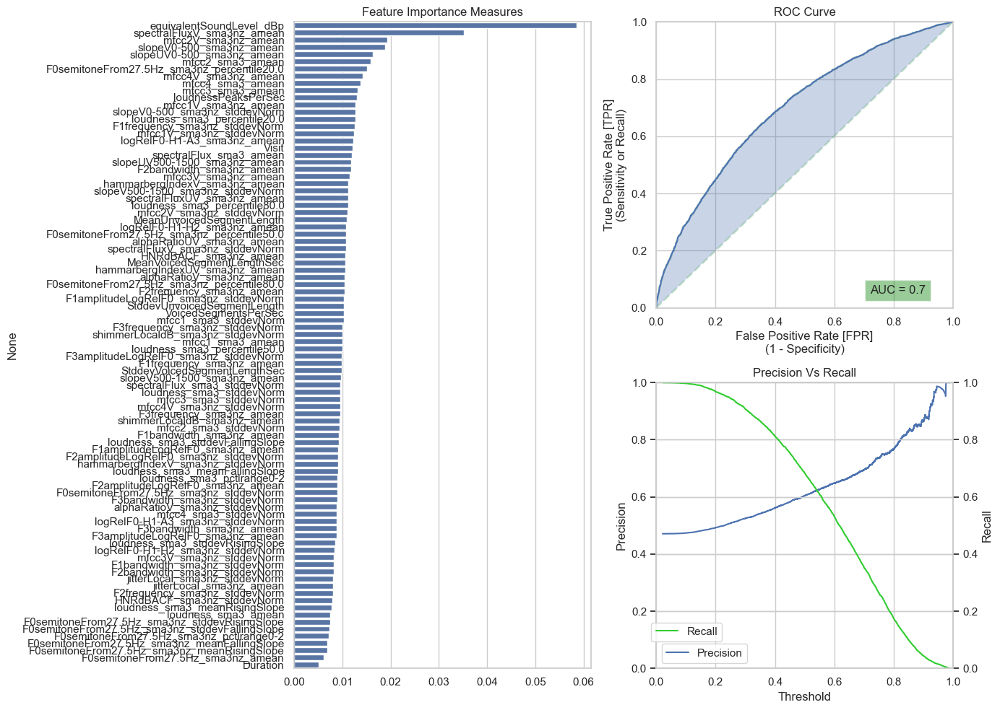

Training and evaluating on same participants from visit 4
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8639508711258084, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.09266307881793942,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=8, max_leaves=None,
              min_child_weight=1.6750810285737576e-10, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=-1, num_parallel_tree=None, random_state=0, ...)

=============================> TRAIN-TEST DETAILS <======================================
Train Size: 49522 samples
 Test Size: 98

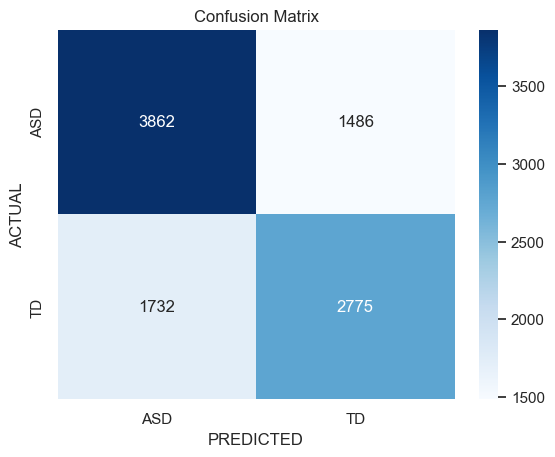


=======================================> PLOTS <=========================================


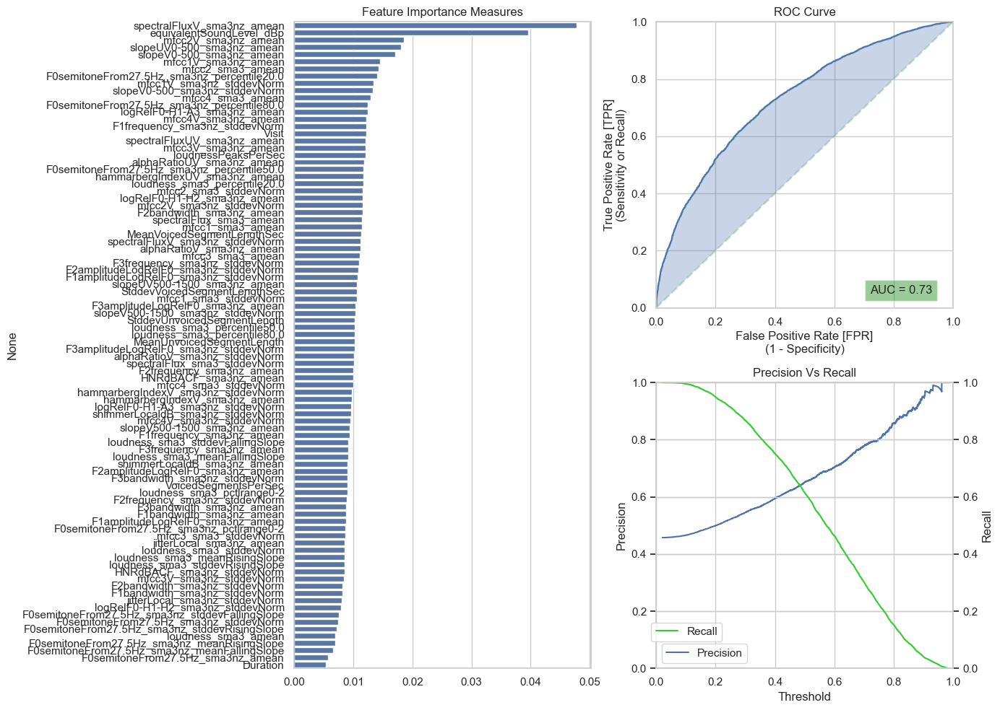

Training and evaluating on same participants from visit 5
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8639508711258084, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.09266307881793942,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=8, max_leaves=None,
              min_child_weight=1.6750810285737576e-10, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=-1, num_parallel_tree=None, random_state=0, ...)

=============================> TRAIN-TEST DETAILS <======================================
Train Size: 49366 samples
 Test Size: 10

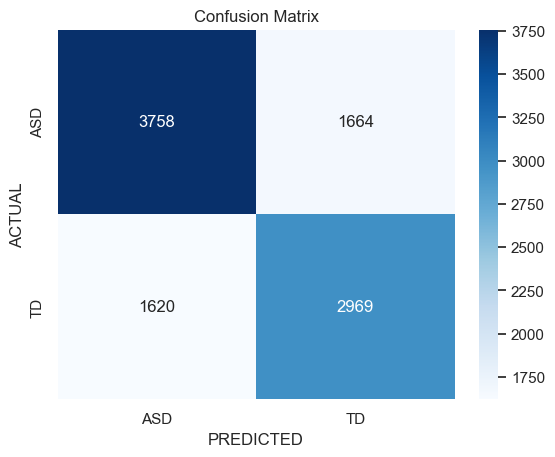


=======================================> PLOTS <=========================================


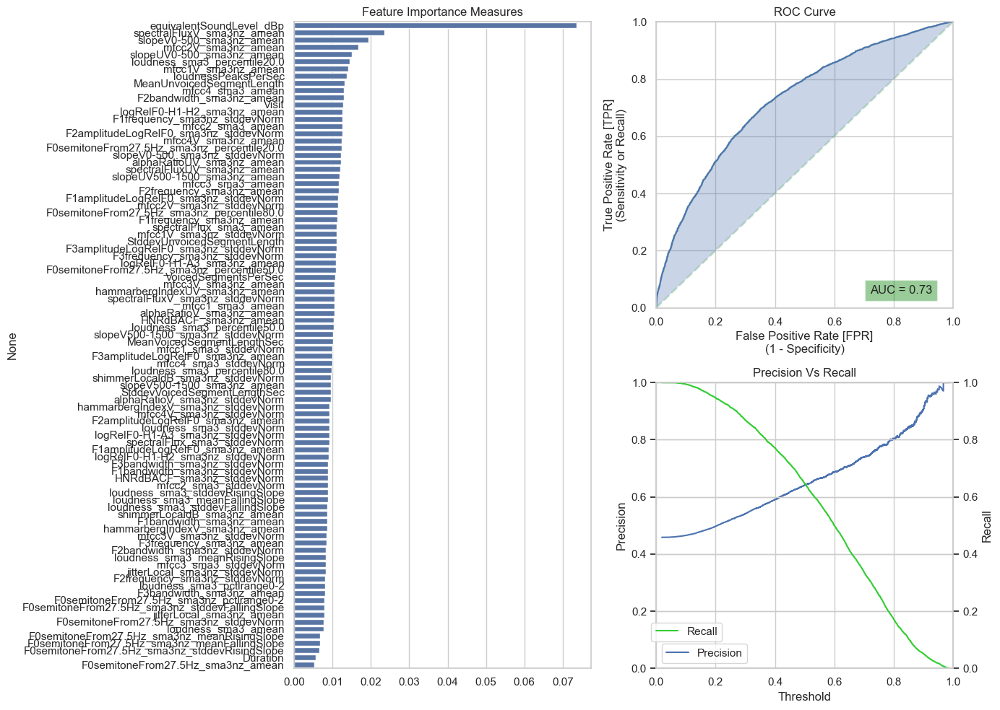

Training and evaluating on same participants from visit 6
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8639508711258084, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.09266307881793942,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=8, max_leaves=None,
              min_child_weight=1.6750810285737576e-10, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=-1, num_parallel_tree=None, random_state=0, ...)

=============================> TRAIN-TEST DETAILS <======================================
Train Size: 49913 samples
 Test Size: 94

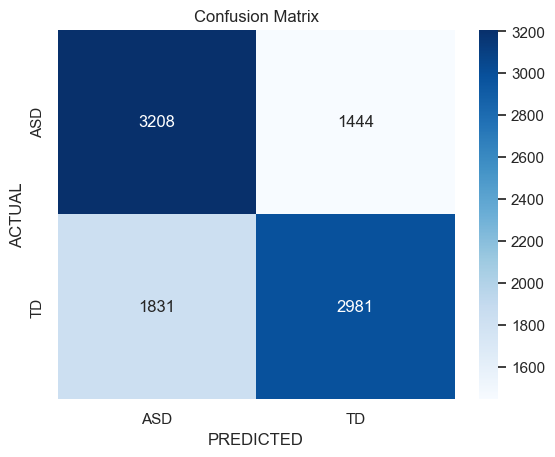


=======================================> PLOTS <=========================================


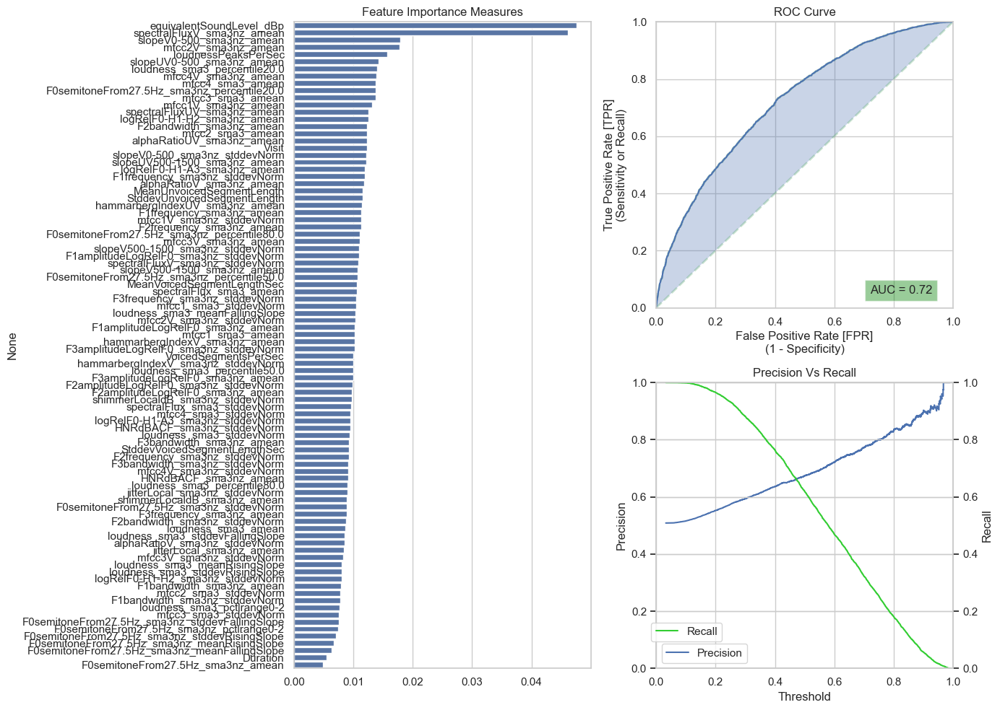

Training and evaluating on new participants from visit 1
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8639508711258084, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.09266307881793942,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=8, max_leaves=None,
              min_child_weight=1.6750810285737576e-10, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=-1, num_parallel_tree=None, random_state=0, ...)

=============================> TRAIN-TEST DETAILS <======================================
Train Size: 42619 samples
 Test Size: 136

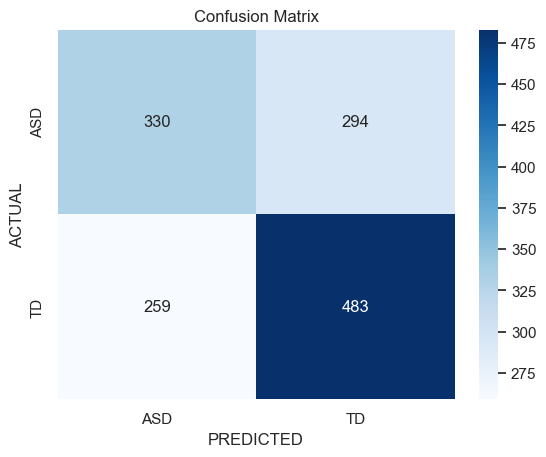


=======================================> PLOTS <=========================================


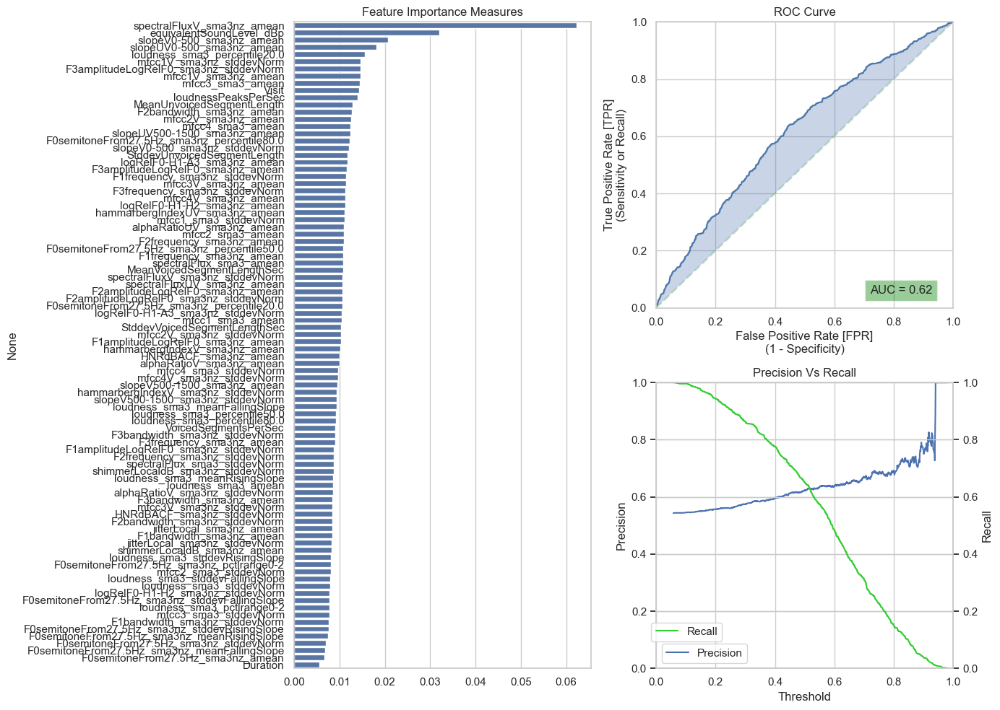

Training and evaluating on new participants from visit 2
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8639508711258084, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.09266307881793942,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=8, max_leaves=None,
              min_child_weight=1.6750810285737576e-10, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=-1, num_parallel_tree=None, random_state=0, ...)

=============================> TRAIN-TEST DETAILS <======================================
Train Size: 40432 samples
 Test Size: 148

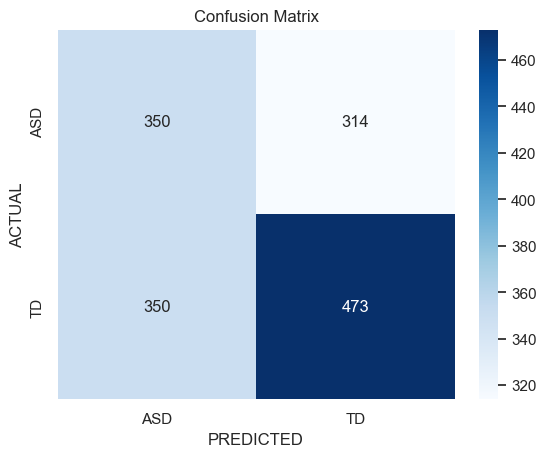


=======================================> PLOTS <=========================================


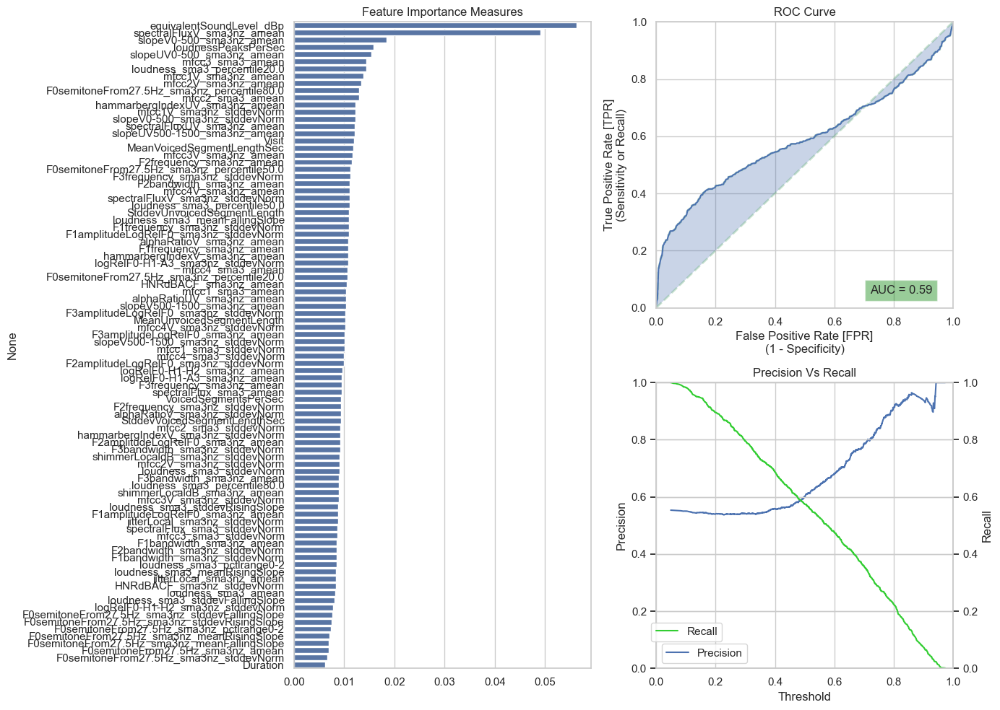

Training and evaluating on new participants from visit 3
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8639508711258084, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.09266307881793942,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=8, max_leaves=None,
              min_child_weight=1.6750810285737576e-10, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=-1, num_parallel_tree=None, random_state=0, ...)

=============================> TRAIN-TEST DETAILS <======================================
Train Size: 42005 samples
 Test Size: 155

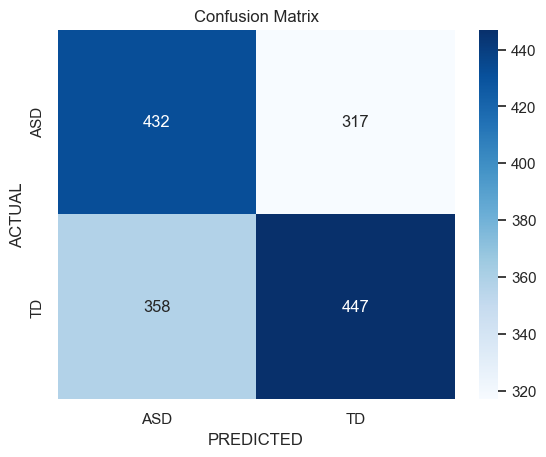


=======================================> PLOTS <=========================================


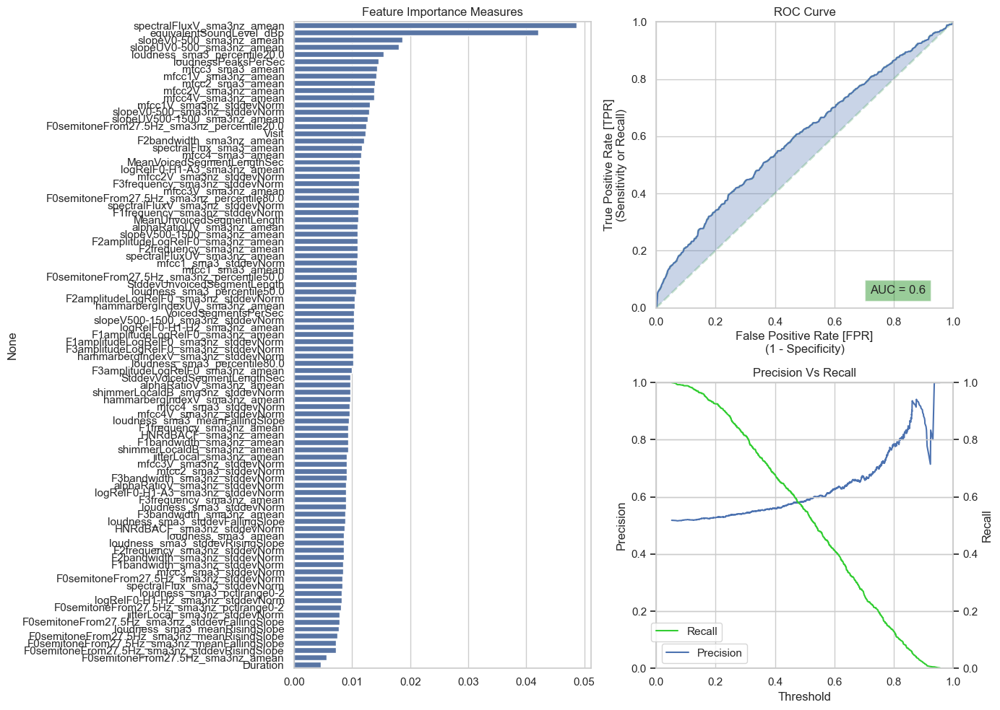

Training and evaluating on new participants from visit 4
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8639508711258084, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.09266307881793942,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=8, max_leaves=None,
              min_child_weight=1.6750810285737576e-10, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=-1, num_parallel_tree=None, random_state=0, ...)

=============================> TRAIN-TEST DETAILS <======================================
Train Size: 42089 samples
 Test Size: 171

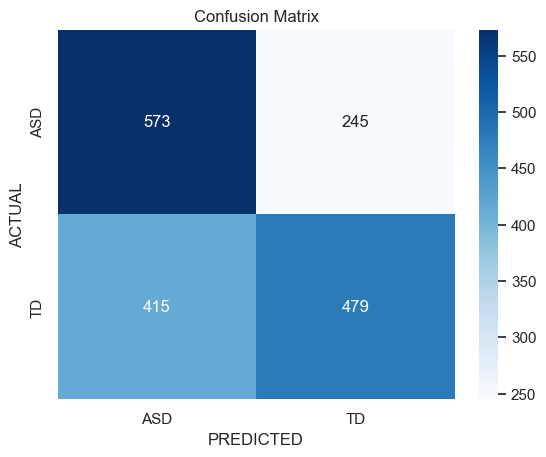


=======================================> PLOTS <=========================================


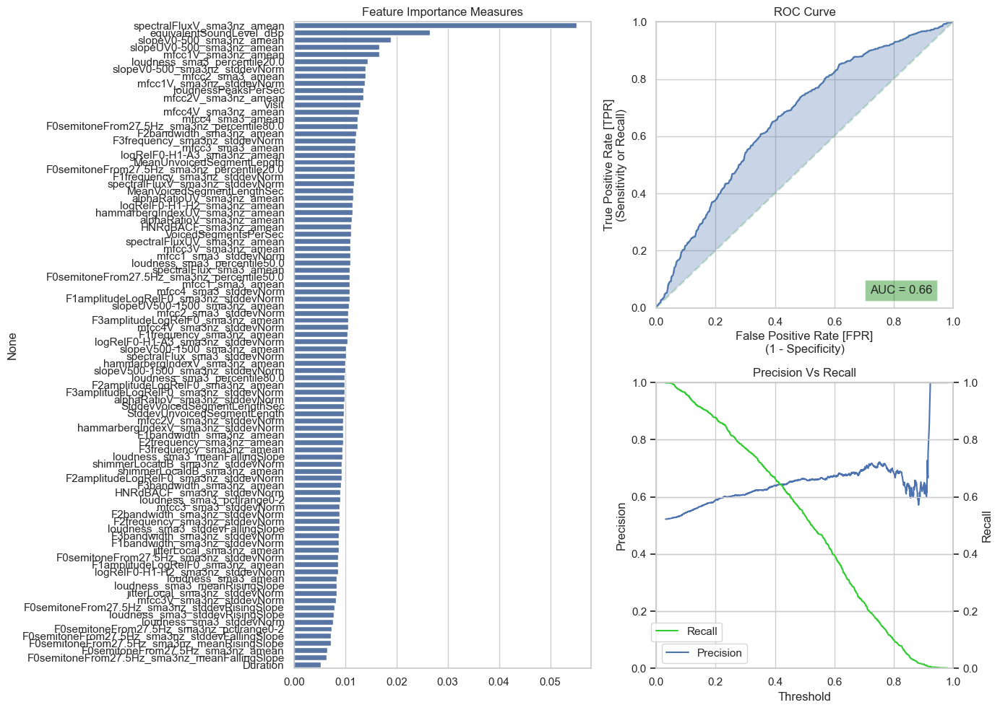

Training and evaluating on new participants from visit 5
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8639508711258084, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.09266307881793942,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=8, max_leaves=None,
              min_child_weight=1.6750810285737576e-10, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=-1, num_parallel_tree=None, random_state=0, ...)

=============================> TRAIN-TEST DETAILS <======================================
Train Size: 41659 samples
 Test Size: 143

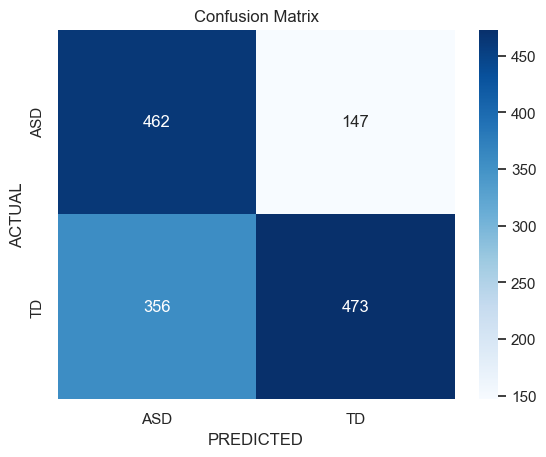


=======================================> PLOTS <=========================================


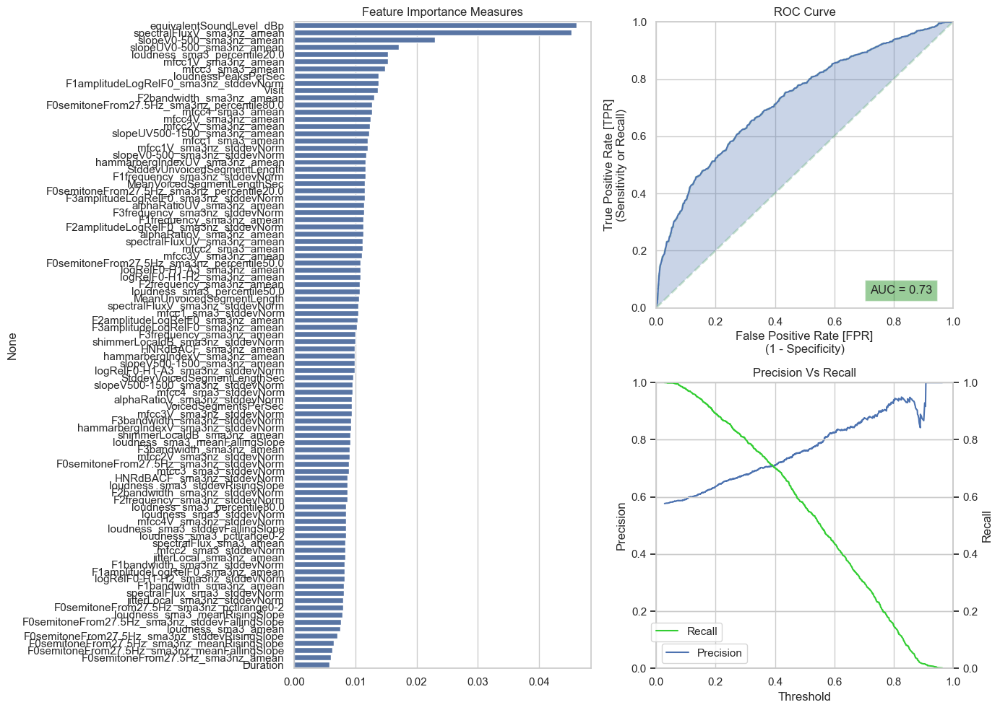

Training and evaluating on new participants from visit 6
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8639508711258084, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.09266307881793942,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=8, max_leaves=None,
              min_child_weight=1.6750810285737576e-10, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=-1, num_parallel_tree=None, random_state=0, ...)

=============================> TRAIN-TEST DETAILS <======================================
Train Size: 42356 samples
 Test Size: 158

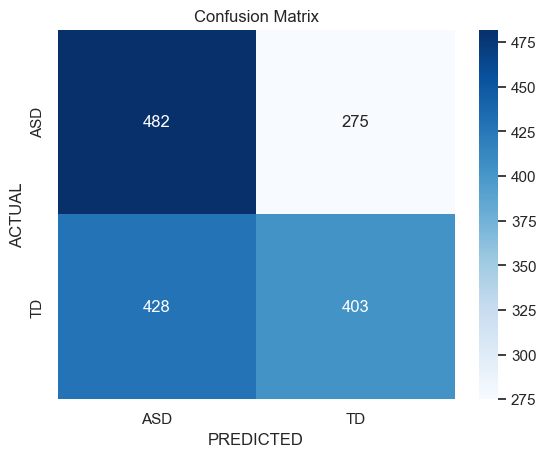


=======================================> PLOTS <=========================================


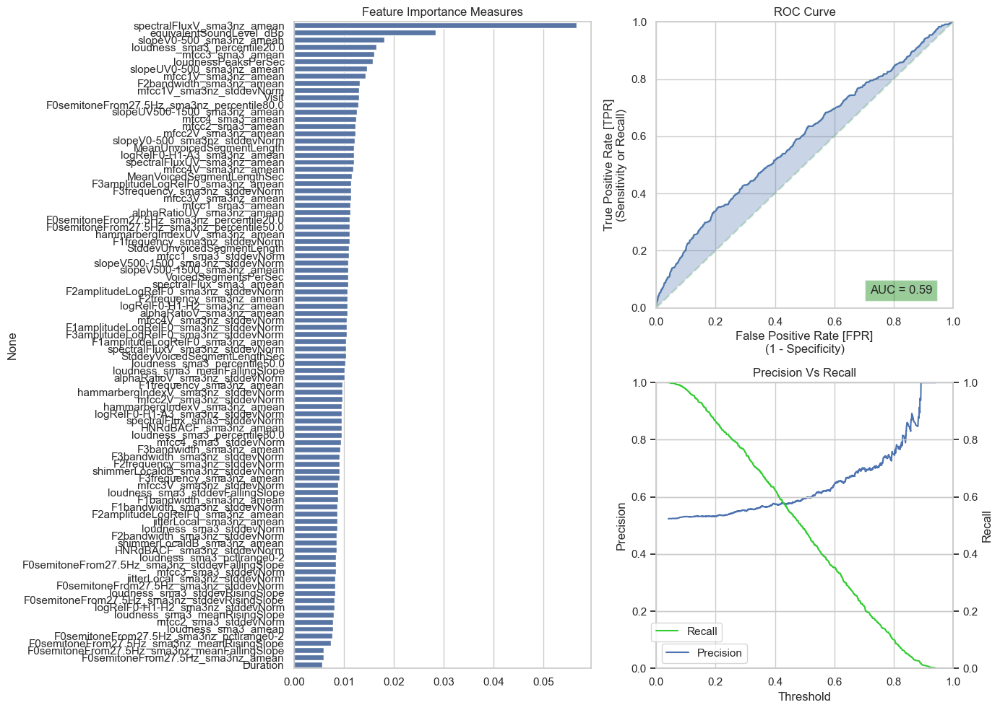

In [44]:
# Train and evaluate models using the best parameters
f1_df = train_and_evaluate(splits_same, splits_new, xgb_clf_tuned_2)

In [112]:
f1_df
